# Introduction

### Defining problem
We want to take an example music file and classificate it to its genre. 
Our dataset will be labeled <br>
with respect to certain genre types so it will be multiclass classification problem. To measure  <br>
model performance we will use measures like accuracy, precision, recall and F1 score. <br><br>

I decided to complete this project for educational purpose. It should expand my experience in handling data containing audio files. I chose this type of problem first of all, because it should be an introduction to analyzing audio for machine learning for me. Secondary, I wanted to gain more expirience in the topic of my thesis which concerns the usage of hidden markov models in speech recognition. I also wanted to check a certain data science project framework which I read about in article below. I really recommend it.<br>
https://machinelearningmastery.com/process-for-working-through-machine-learning-problems/ <br><br>

I believe that after this project I improve my skills in processing audio signals and mining useful informations from them. I want also to have fun because music is something what is precious to me as a guitar player.<br>

### Solving problem schedule: <br>
 - Prepare the data
     - Download  GTZAN dataset and inspect what data it contains
     - Create entire data frame
     - Missing values handling
 - Data preprocessing
     - organize  selected data by formatting, cleaning and sampling from it.
 - Data Transformation
     - extracting features
     - scaling
     - attribute decomposition
     - attribute aggregation
 - Spot Check algorithms
    - selecting some popular classification algorithms to solve this problem
    - creating necessary pipelines to compare algorithms performance. 
 - Improve results
    - algorithm tuning
    - ensemble methods
    - extreme feature engineering
 - Conclusion

# Prepare the data

First of all let's import necessary libraries.

In [2]:
# importing basic libraries
import os
import joblib
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# my visualization.py file
import visualization as vis

# libraries for audio handling
import librosa
import librosa.display
import IPython.display as ipd

# Machine learning functions
import sklearn
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, StackingClassifier, AdaBoostClassifier
from sklearn.dummy import DummyClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_validate, StratifiedKFold, GridSearchCV, RandomizedSearchCV,  train_test_split
from sklearn.cluster import KMeans
from xgboost import XGBClassifier

# in the presentation form we hide warnings
import warnings

Please note that visualization is a python file which should be in working directory with this notebook. <br> 
For the presentation usage we will ignore different warnings. I add this line in final run of code because they were useful during creating model. 

In [2]:
# Ignoring warnings
warnings.filterwarnings('ignore')
# seaborn theme
sns.set()
# chaging default figsize from matplotlib's plots
matplotlib.rcParams['figure.figsize'] = (8, 8)

We set up custom random seed because I want these results to be reproducible.

In [3]:
# customizing random seed
np.random.seed(8)

Finally, we can create our data frame. Because we don't want to store signal of every audio file (they can represent vectors with 12 000 elements) so we append only the file paths with corresponding label. We choose file path instead only name of the file because we will require reference to certain observation.

In [4]:
# Empty dataframe
df = pd.DataFrame({'file':[], 'label':[]})
# working directory
cwd = os.getcwd()

# iterating over directories
for dir_path, dir_names, file_names in os.walk(cwd):
    # We check the level with all genres names, it is a list which definitely contains 'blues'
    if 'blues' in dir_names:
        class_names = dir_names
    # If there is a file
    try:
        f = file_names[0]
        if f.endswith('.wav'):
            # We want to extract the genre name
            splitted_f = f.split('.')
            # path to the file
            path_to_file = os.path.join(*dir_path.split('\\')[-3:])
            # path to the files with their names
            files = [os.path.join(path_to_file, fn) for fn in file_names]
            # Stacking dataframe
            df_hold = pd.DataFrame({'file': files,
                                    'label':[splitted_f[0]] * len(files)})
            df = df.append(df_hold, ignore_index=True)
    except:
        continue

# Shuffling dataframe
df = df.sample(frac=1).reset_index(drop=True)        

Let's take a look how does it look like.

In [5]:
df

,file,label
0,data\genres\rock\rock.00008.wav,rock
1,data\genres\country\country.00065.wav,country
2,data\genres\metal\metal.00027.wav,metal
3,data\genres\disco\disco.00027.wav,disco
4,data\genres\country\country.00044.wav,country
...,...,...
995,data\genres\rock\rock.00086.wav,rock
996,data\genres\classical\classical.00033.wav,classical
997,data\genres\disco\disco.00061.wav,disco
998,data\genres\disco\disco.00040.wav,disco


It looks great. Let's check if everything is okay, in that case we import a sample audio with possibility to listen.

In [6]:
sample_file = r'data\genres\disco\disco.00027.wav'
ipd.Audio(sample_file)

Everything is working. I hoped that it would be "Never gonna give you up"... It wasn't so I leave the link here :D <br> https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab_channel=RickAstleyVEVO 

###  Checking missing values

We try one observation, but what if different can be broken? For that purpose we check the length of every file, because if it will be considerably shorter than 30 sec it can disturb our model performance. Audio files are in fact a wave signal in time. Because of that we can also examine standard deviation of such file. If it will be near 0 it means there is no sound so it is a missing value. We can check only minimum of length and std. If everything is alright so dataset doesn't posses missing values. 

In [7]:
len_list = []
std_list = []
for i in df.file:
    # x is a vector and sr is a sampling rate 
    x, sr = librosa.load(i, sr=22050)
    n = x.shape[0]
    # appending how long the observation takes
    len_list.append(n / sr)
    # standard deviation of wave
    std_list.append(np.std(x))
min(len_list), min(std_list)

(29.931972789115648, 0.0075857025)

Length of 29 seconds is pretty good, because it's near 30s. What worries us is this low standard deviation. We should listen to this sample and check if it is a real piece or missing.

In [8]:
# index of observation with min std
idx = std_list.index(min(std_list))
low_std_file = df.loc[idx, 'file']
ipd.Audio(low_std_file)

It is really lowered but it can be specific of this composition. To compare it, we can listen to piece, which has the greatest std.

In [9]:
# index of observation with max std
idx2 = std_list.index(max(std_list))
high_std_file = df.loc[idx2, 'file']
ipd.Audio(high_std_file)

I could write to turn the speakers down. The difference is significant, but it probably will help to distinguish types from each other. The other form of comparison is to check it visually. Firstly we can draw wave plots and see how this signals really look like.

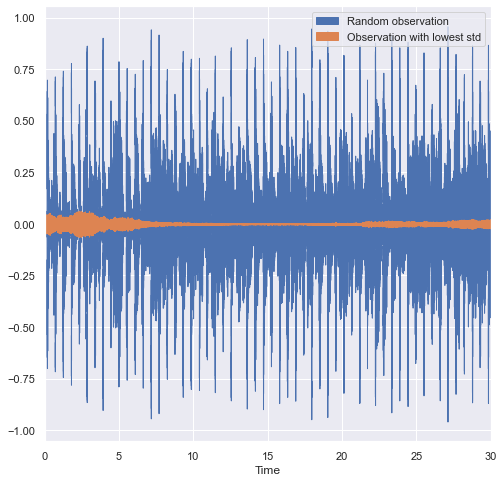

In [10]:
x1, sr = librosa.load(low_std_file)
x2, sr = librosa.load(sample_file)
# plotting signal
librosa.display.waveplot(x2)
librosa.display.waveplot(x1)
plt.legend(['Random observation', 'Observation with lowest std'])
plt.show()

Difference is enormous. Someone can say that the quieter piece is almost straight line. We should think a bit if this piece can be an outlier. Perhaps other files have normal volume. To check it, we can draw the histogram and boxplot of standard deviations.

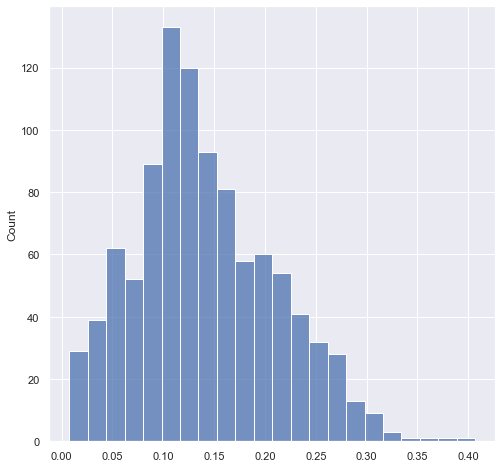

In [11]:
sns.histplot(std_list)
plt.show()

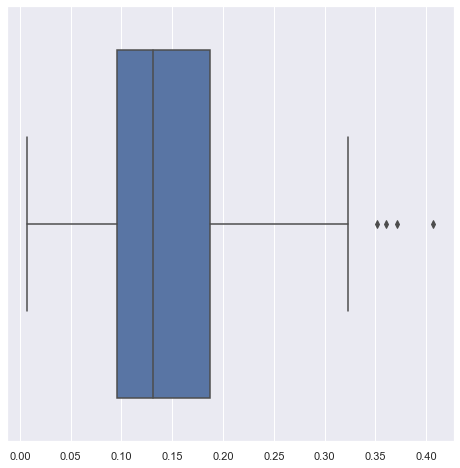

In [12]:
sns.boxplot(x=std_list)
plt.show()

It looks that there are some quiet files so it shouldn't imbalance our data. There are some very noise pieces. Further, we can inspect if scaling like standard scaling can improve performance of our model.

#### Dividing on train and text dataset

We will need to check our model result on unseen data. Because we don't have option to provide real labeled data after learning so for now we should divide our data set on train and test data. It is the common manoeuvre if we want to check how our model will work on production and as fast we will split it as reliably will be our solution.  

In [13]:
# randomly splitting dataframe on test and train set
X_train, X_test, y_train, y_test = train_test_split(df['file'], df['label'], 
                                                    stratify=df['label'], test_size=0.2)

# concatenating Xs with ys
train = pd.concat([X_train, y_train], axis=1)
test = pd.concat([X_test, y_test], axis=1)

On the beginning we knew that our data set was balanced. There were 100 samples from each class. We should keep this balance in our train set to eliminate further problems. We used stratify parameter during data splitting so everything should be fine. We can check it visually with count plot.

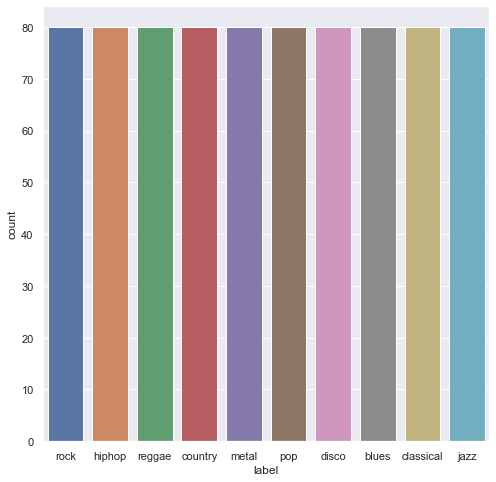

In [14]:
sns.countplot(x=train['label'], data=train)
plt.show()

Train set is balanced.

# Data Transformation

So far so good. Now we can make some feature engineering. We have to create some numeric features, which our model will use in classification. We will use default options from librossa library which provides plenty of methods to calculate. Most of them return vectors or even 2D matrices so we will constraint ourselves to calculating std and mean from them.

### Feature extraction

In [15]:
# name of features to create
features = ['wave_std', 'wave_mean', 'db_mean', 'db_std', 'zero_crossing', 
           'spectral_rolloff_mean', 'spectral_rolloff_std']

# mfcc features names (default we have 20)
for i in range(1, 21):
    features.append('mfcc_{}'.format(i))

# creating columns filled with 0
for i in features:
    train[i] = 0

In [16]:
def feature_extract(df):
    '''Function to extract certain features from dataframe
    containing path do audio file
    -------
    return dataframe'''
    # iterating over index and path to file
    for i, file in zip(df.index, df.file):
        # creating wave
        x, sr = librosa.load(file)
        
        # basic statistics of wave
        df.loc[i, 'wave_std'] = np.std(x)
        df.loc[i, 'wave_mean'] = np.mean(x)
        
        # Preparing the frequency in decibel
        X = librosa.stft(x)
        Xdb = librosa.amplitude_to_db(np.abs(X))
        df.loc[i, 'db_mean'] = np.mean(Xdb)
        df.loc[i, 'db_std'] = np.std(Xdb)

        # zero crossings
        df.loc[i, 'zero_crossing'] = np.sum(librosa.zero_crossings(x))

        # spectral rolloff
        spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=sr)
        df.loc[i, 'spectral_rolloff_mean'] = np.mean(spectral_rolloff)
        df.loc[i, 'spectral_rolloff_std'] = np.std(spectral_rolloff)    

        # mfcc features
        idx_mfcc = features.index('mfcc_1')
        mfccs = librosa.feature.mfcc(x, sr=sr)
        # iterating over 20 mfcc features
        for mfcc, col in zip(mfccs, features[idx_mfcc:]):
            df.loc[i, col] = np.mean(mfcc)
        
    return df

We prepared the pipe, so we can now calculate it.

In [17]:
train = feature_extract(train)
train['label'] = train['label'].astype('category')

Calculations were demanding because we import every audio file and perform complex calculations of them so it took some time, but bellow we can see that we gain 27 more columns which is not bad.

In [18]:
train

,file,label,wave_std,wave_mean,db_mean,db_std,zero_crossing,spectral_rolloff_mean,spectral_rolloff_std,mfcc_1,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20
935,data\genres\rock\rock.00003.wav,rock,0.163970,-0.000012,-15.175387,14.819819,28563,3042.493384,1591.589928,-156.540115,...,-3.781854,11.536494,-3.209727,5.060294,-1.776723,3.542736,-2.437564,-0.724597,-1.420623,0.652950
662,data\genres\hiphop\hiphop.00053.wav,hiphop,0.115207,-0.000024,-8.449903,11.775224,70991,7003.520270,2136.235833,-144.889725,...,3.566271,2.523827,3.831300,3.722039,6.825731,5.068255,0.479522,1.080769,1.951962,-0.077099
277,data\genres\reggae\reggae.00030.wav,reggae,0.088561,-0.000015,-19.831137,14.580263,46716,4068.834458,2163.905251,-239.272232,...,1.502905,16.053072,2.812533,5.943269,-6.300944,-1.046081,-6.334123,2.149256,-6.635876,-5.265618
166,data\genres\hiphop\hiphop.00033.wav,hiphop,0.221244,-0.001427,-0.152441,11.435061,101847,6169.834153,1622.437612,-31.728672,...,1.084988,3.819555,1.654761,1.226787,-1.499597,-0.141227,-1.545364,1.800539,1.548790,-2.305554
190,data\genres\country\country.00083.wav,country,0.137847,-0.000022,-16.512728,16.154051,39467,2924.277264,1286.138574,-148.502502,...,-10.480563,9.912003,-5.066421,1.347451,-0.558098,2.862679,-8.091743,2.111785,-2.486036,-4.434617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,data\genres\jazz\jazz.00099.wav,jazz,0.044330,-0.000032,-28.270460,12.326286,30611,3375.924959,1511.749839,-315.025909,...,-4.880476,4.704837,-2.706322,3.831236,0.848350,3.361032,-2.101264,-1.239171,1.790819,-2.229562
30,data\genres\disco\disco.00007.wav,disco,0.174314,-0.000021,-1.977001,11.410687,92985,6098.076557,1306.841012,-53.397984,...,-0.543144,0.962052,0.490434,-0.172562,-1.813016,-2.525263,0.823475,-0.336446,0.561604,2.767691
644,data\genres\jazz\jazz.00066.wav,jazz,0.177340,-0.001440,-13.911277,13.773616,59038,2967.528042,753.980518,-118.420578,...,-4.350816,0.321263,-4.542603,2.838219,-5.169090,5.335265,-1.236292,3.580471,-0.513063,0.326944
650,data\genres\classical\classical.00004.wav,classical,0.044730,-0.000159,-27.174587,14.882059,74801,3174.931743,577.292715,-259.915131,...,-17.982002,-1.185533,-6.355772,2.748989,-2.585194,4.403328,-4.125299,-4.787771,-4.774069,-4.603728


We can also check if everything went well. We calculate the mean of every column per genre. This saved my life, because I prevent some dangerous mistakes. Cells should differ from each other, if in any column there will be the same values we should check it carefully, because there could be some mistakes in code. <br>
Everything looks good so we can move farther.

In [12]:
train.groupby('label')[features].mean()

,wave_std,wave_mean,db_mean,db_std,zero_crossing,spectral_rolloff_mean,spectral_rolloff_std,mfcc_1,mfcc_2,mfcc_3,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20
label,,,,,,,,,,,,,,,,,,,,,
blues,0.144192,-0.001092,-15.448686,14.702772,53181.7125,3628.509598,1121.274432,-166.687387,113.834334,-8.162533,...,-9.077814,4.095603,-7.798851,1.337137,-6.554020,0.419797,-6.795884,-1.292153,-3.350948,-2.261865
classical,0.048210,-0.000404,-31.037344,14.160303,51533.4500,2463.993233,705.087535,-323.683532,141.535924,-19.664548,...,-6.042714,-0.398941,-2.204574,-0.519712,-0.334845,1.173793,0.245901,0.856659,-0.969120,-1.129537
country,0.129793,-0.000138,-14.623598,14.240420,53870.2125,3836.141389,1294.316979,-150.988212,115.688999,-7.748097,...,-6.882733,2.614987,-5.405246,-0.448129,-4.685579,-0.530062,-5.783965,-0.628146,-2.829281,-3.025717
disco,0.146938,-0.000434,-7.560044,13.710264,84921.9250,5515.451712,1323.912101,-95.329918,85.286015,-9.554972,...,-7.468175,5.588020,-6.154589,2.847509,-5.344546,1.271819,-4.287221,1.224162,-2.930008,0.654025
hiphop,0.192633,-0.000813,-7.307136,13.316643,72442.2500,5365.078533,1503.618410,-104.678372,79.094937,-0.906257,...,-2.854303,7.104203,-2.682437,3.817649,-2.737355,2.532083,-2.936252,1.369414,-1.794096,-0.692931
jazz,0.095405,-0.001350,-19.590901,13.233814,51409.6375,3806.093151,1152.263233,-211.345466,113.698843,-4.397378,...,-4.269897,1.984568,-2.887893,1.308828,-2.614246,0.291738,-1.421552,-0.852435,-1.157101,-2.161147
metal,0.162651,-0.001576,-5.713063,16.223014,96936.8000,5108.038415,843.328416,-60.676940,86.108747,-31.181873,...,-11.471198,13.323631,-12.017570,6.303747,-8.776478,5.393165,-7.761098,2.884274,-4.796922,1.205298
pop,0.214703,0.000049,-2.575621,11.478124,90584.5500,6679.362190,1674.482093,-66.757566,66.577766,11.217153,...,-2.266500,-0.038198,-0.646571,-0.743330,-0.504736,-0.786094,-0.052226,0.813522,0.981597,0.496242
reggae,0.130146,-0.001582,-13.770513,13.777528,58524.0000,4560.085843,1711.347747,-165.812132,93.874769,-1.686686,...,-1.400200,4.931371,-0.900833,1.882261,-1.016956,1.229219,-3.386035,1.259199,-2.300132,-1.743155


In [21]:
train['label'] = train['label'].astype('category')

We can check it also via pair plot which will return scatter plots for every pair of columns in our data. As we can see bellow it looks not bad. There are some high correlated features, but for now it is significant that we don't have straight lines.  

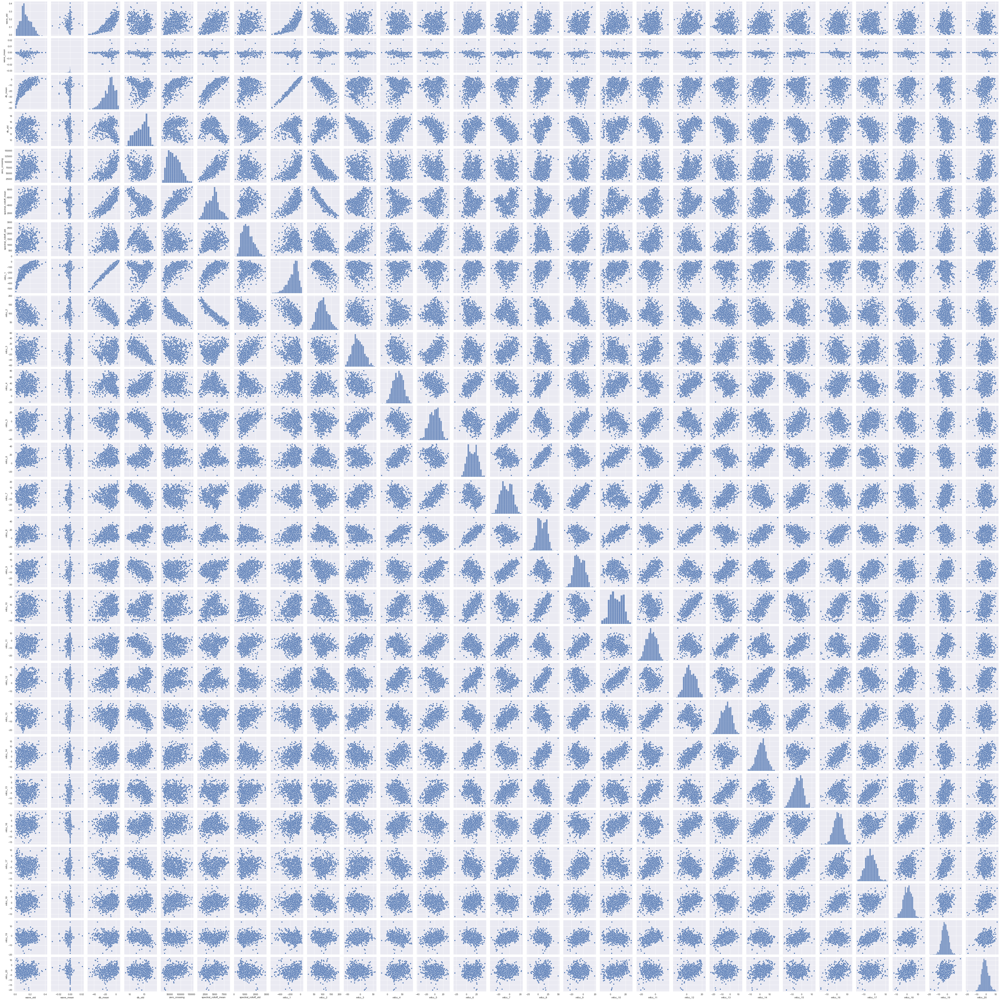

In [22]:
sns.pairplot(train)
plt.show()

### Feature importance

Most of the models have problems eather with high rank matrices and high correlated features. Perhaps some columns aren't valid or are so highly correlated that we can remove them. <br>
If there are features with far greater feature importance we should consider removing smaller ones. So for now let's calculate feature importance. To this purpose we use three algorithms: Decision Tree, Random Forest and XGBoost. Their implementations provide feature_importance_ attribute, which we can use to verify how the feature contributes to predictions. We calculate this statistic for every algorithm to have reliable solutions. These algorithms are stochastic, so we train them 10 times and we will average results of obtained feature importance. 

In [23]:
# Extracting numeric features
train_num = train.drop(['file', 'label'], axis=1)

In [24]:
def importances_calculation(model, X, y, n=10):
    '''This function calculates feature importance of given model,
       results are perform n times because of stochastic nature of model and
       in the end they are averaged
       
       Parameters
       -------------------
       model: keras model object
       X:  array like
           it is a matrix of independent variables
       y: array like
          it is our target variable
       n: int
           number of iterations
           
       Returns
       ------------------
       numpy array of len(X.shape[1]) with feature importance of each column'''
          
    for _ in range(n):
        model.fit(X, y)
        try:
            # if feature_importance array was create then concatenate
            feature_importance = np.vstack([feature_importance, model.feature_importances_])
        except:
            # create feature importance array
            feature_importance = model.feature_importances_
    # mean of individual feature importance
    feature_imp_arr = np.mean(feature_importance, axis=0)
    return feature_imp_arr

In [25]:
# Decision tree feature importance
dtc = DecisionTreeClassifier()
dtc_importance = importances_calculation(dtc, train_num, train['label'])

# Random forest feature importance
rfc = RandomForestClassifier()
rfc_importance = importances_calculation(rfc, train_num, train['label'])

# XGBoost feature importance
xgb_c = XGBClassifier()
xgb_importance = importances_calculation(xgb_c, train_num, train['label'])

Below we can see our results.

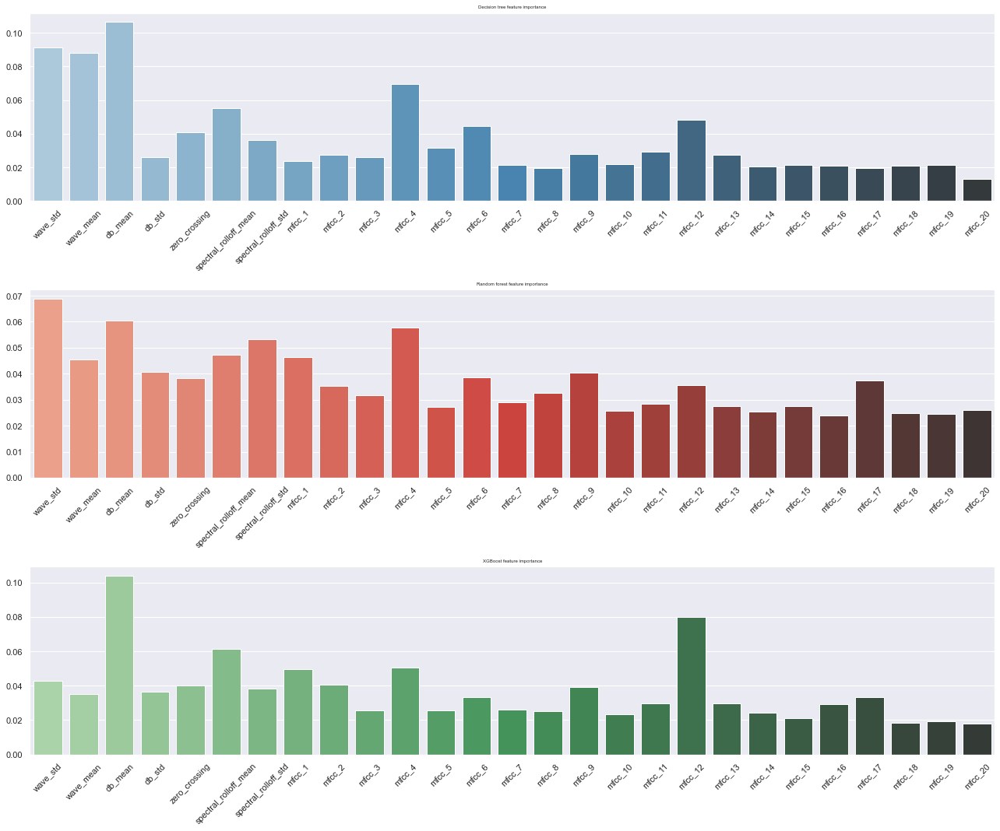

In [26]:
vis.draw_bar_importance(train_num.columns, dtc_importance, rfc_importance, xgb_importance)

As we can see there are some distinctive features, but generally all columns contribute similar amount of information to our models. For this reason we shouldn't remove any column for now.

### Feature Selection

One of the biggest problems for some machine learning algorithms is high correlation between your features. It is logical because when you have two features with absolute of correlation near one they can't provide a unique information and they only increase rank of our input matrix and also give some noise to the data. So the best option is to remove one of the columns which have high correlation. We can draw a correlation matrix to check visually if there is high correlation between our columns. 

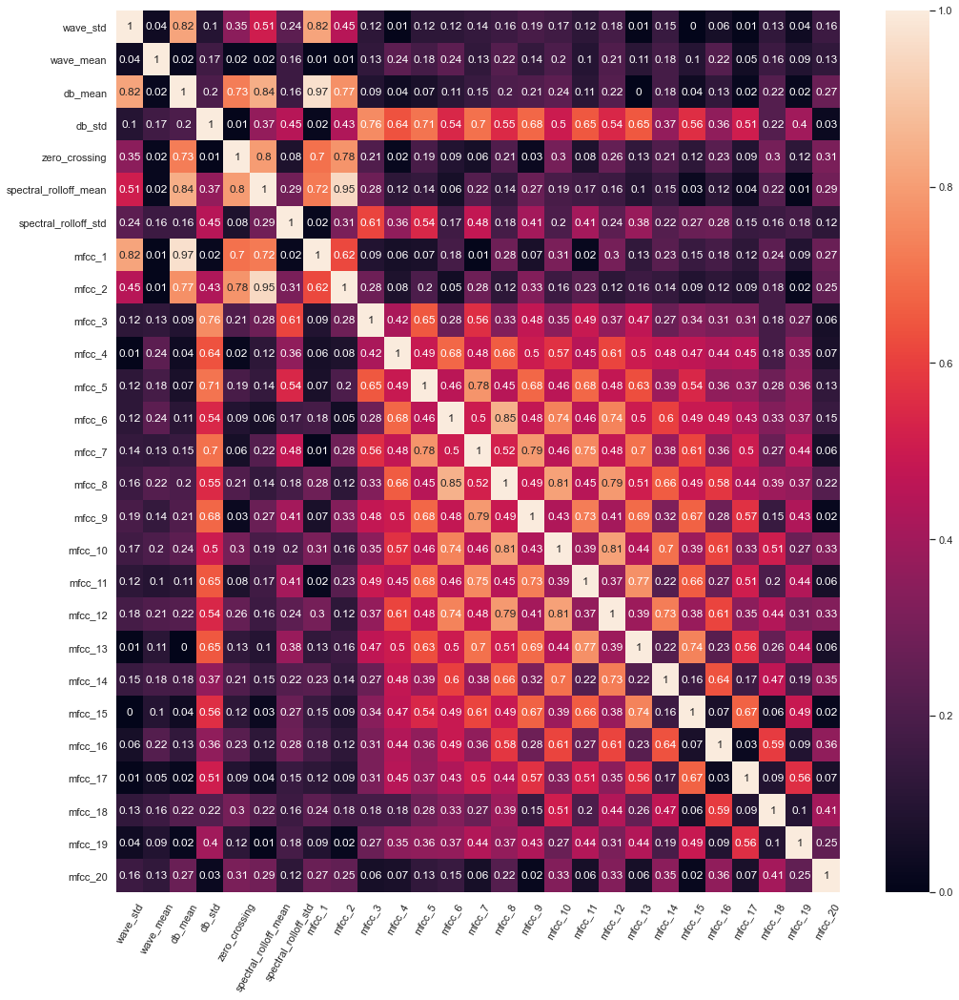

In [27]:
plt.figure(figsize=(17, 17))
# spearman correlation rounded to second decimal
sns.heatmap(np.abs(np.round(train.corr(method='spearman'), 2)), vmin=0, vmax=1, annot=True)
plt.xticks(rotation=60)
plt.show()

We setting a threshold to 0.9, so every pair of columns with correlation above that number is considered as problematic. As we can see there are two pairs and we have to ask yourself a question which one we should remove? We can use feature importance from the previous section. We can clearly observe that mfcc_1 has smaller each feature importance than db_mean and mfcc_2 is worse than spectral_rolloff_mean. So we have to drop mfcc_1 and mfcc_2 columns.

In [28]:
# removing columns
train_num = train_num.drop(['mfcc_1', 'mfcc_2'], axis=1)

# Spot-check alghorithms 

This is the moment of pre train some algorithms. We should prepare bunch of classification algorithms and check which are performing well. We will use sklearn library so at the beginning we should divide our train set on X matrix with features and y vector with labels. It is recommended for using sklearn's syntax.

In [29]:
X, y = train_num, train['label']

Below, we select about ten types of algorithms to this task and we can check how well they perform. <br>
List of algorithms:
- DummyClassifier
- Logistic Regression
- SVM
- KNN
- Decision tree
- Random Forest
- Multinomial Naive Bayres
- AdaBoost
- XGBoost
- CNN

It is crucial to include Dummy Classifier because we want to check the result of the baseline algorithm and compare it to the better ones. <br>
Each of the algorithms performs better for certain type of scaling and we should allow them to spread their wings. For this purpose we will train each model with standard scaled, min max scaled and without scaling data. Below we can see an instance of each class.

In [30]:
# scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()

# scaling
X_std_scaled = standard_scaler.fit_transform(X)
X_mm_scaled = minmax_scaler.fit_transform(X)

# Dummy classificatior
dummy = DummyClassifier()

# Logistic Regression
log_reg = LogisticRegression(max_iter=1000)
                     
# Support vector machine
svc = SVC()

# K-nearest neighbors
knn_4 = KNeighborsClassifier(n_neighbors=4)
knn_7 = KNeighborsClassifier(n_neighbors=7)
knn_10 = KNeighborsClassifier(n_neighbors=10)

# Decision tree
dtc = DecisionTreeClassifier(max_depth = 25)

# Random Forest
rfc = RandomForestClassifier(max_depth = 25)

# Naive Bayes
multi_nb = MultinomialNB()

# Ada Boost
ada = AdaBoostClassifier(n_estimators=100)

# XGBoost
xgb = XGBClassifier(objective='multi:softprob', max_depth=25)

# Neural network
mlp = MLPClassifier((100, 100, 100, 100), batch_size=16,
                    learning_rate='adaptive', early_stopping=True)

KNN is this type of algorithm for which the number of neighbors parameter can significantly improve results, so I decided to include version with n=4, n=7 and n=10.

In [31]:
# appending models to list
models = [('Dummy Classifier', dummy),
          ('Logistic Regression', log_reg),
          ('SVC', svc),
          ('KNN4', knn_4),
          ('KNN7', knn_7),
          ('KNN10', knn_10),
          ('Decision tree', dtc),
          ('Random Forest', rfc),
          ('Naive Bayes', multi_nb),
          ('Ada Boost', ada),
          ('XGBoost', xgb),
          ('Neural network', mlp)]

In [32]:
def unpacking_measures_dict(name, dictionary):
    '''This function extracts certain information from given dict and
           returns well prepared dataframe row.
       
       Parameters
       -------------------
       name: string
           name of current model
       dictionary: dict
           dict of calculated metrics
           
       Returns
       ------------------
       pandas dataframe with one row and 6 columns'''
          
    
    # calculating metrics
    acc = np.mean(dictionary['test_accuracy'])
    recall = np.mean(dictionary['test_recall_weighted'])    
    precision = np.mean(dictionary['test_precision_weighted'])    
    f1 = np.mean(dictionary['test_f1_weighted'])    
    time = np.mean(dictionary['fit_time'])  
    
    # returning row of dataframe
    return pd.DataFrame({'model':[name],
                       'accuracy':[acc],
                       'recall':[recall],
                       'precision':[precision],
                       'F1_score':[f1],
                       'time':[time]})

In [33]:
def spot_check(models, X, X_std, X_mm, y):
    '''This function performs 10 fold cross-validation to calculate basic classification
       metrics during learning with each type of scaling method. 
       
       Parameters
       -------------------
       models: list of tuples
           tuples contain name of the model and model itself
       X:  array like
           it is a matrix of independent variables
       X_std:  array like
           it is a matrix of independent variables scaled with StandardScaler
       X_mm:  array like
           it is a matrix of independent variables scaled with MinMaxScaler
       y: array like
          it is our target variable

       Returns
       ------------------
       pandas dataframe with metrics calculated for each model'''
          
    
    # empty dataframe
    df = pd.DataFrame({'model':[],
                       'accuracy':[],
                       'recall':[],
                       'precision':[],
                       'F1_score':[],
                       'time':[]})
    # our scoring metrics
    scoring = ['accuracy', 'recall_weighted', 'precision_weighted', 'f1_weighted']
    
    # iterating over name and model
    for name, model in models:
        # naive bayes learns only on Min Max scaled features
        if name == 'Naive Bayes':
            # creating row after cross validation
            row = unpacking_measures_dict(name, cross_validate(model, X_mm, y, cv=10, scoring=scoring))
            df = df.append(row, ignore_index=True)
        else:
            # iterating over different scaled datasets
            # suffixes will be added to distinguish certain models
            for data, sufix in zip([X, X_std, X_mm], ['', '_std', '_mm']):
                # creating row after cross validation
                row = unpacking_measures_dict(name+sufix, cross_validate(model, data, y, cv=10, scoring=scoring))
                df = df.append(row, ignore_index=True)
    return df

Let's perform it and check the measures. Take a note that we check 4 metrics instead of one. It can give us some additional information. Their score could be important in imbalanced classification problem, because we would get an information that something went wrong, but because our data set is balanced we will focus on accuracy.

In [34]:
results = spot_check(models, X, X_std_scaled, X_mm_scaled, y)

We can see that the dummy classifier get only 10% for each scaling. It is really poor, but mostly the results are between 50%-70%. It is still not the best we can do for now. Let's choose the best type of scaling for each algorithm. We assume if any model got the same result for each scaling method we take option without scaling to decrease computation complexity.

In [35]:
results

,model,accuracy,recall,precision,F1_score,time
0,Dummy Classifier,0.10000,0.10000,0.010000,0.018182,0.001703
1,Dummy Classifier_std,0.10000,0.10000,0.010000,0.018182,0.000899
2,Dummy Classifier_mm,0.10000,0.10000,0.010000,0.018182,0.000996
3,Logistic Regression,0.42625,0.42625,0.425884,0.399766,0.545471
4,Logistic Regression_std,0.60875,0.60875,0.616269,0.600200,0.063426
5,Logistic Regression_mm,0.57500,0.57500,0.585023,0.555426,0.103154
6,SVC,0.20000,0.20000,0.123731,0.144102,0.041592
7,SVC_std,0.65250,0.65250,0.661364,0.641860,0.033871
8,SVC_mm,0.65125,0.65125,0.668413,0.641055,0.032109
9,KNN4,0.26375,0.26375,0.277832,0.256206,0.004189


In [36]:
# we choose model with best scaling method used during learning
distinct_result = df = pd.DataFrame({'model':[],
                       'accuracy':[],
                       'recall':[],
                       'precision':[],
                       'F1_score':[],
                       'time':[]})

for name, _ in models:
    # inspecting only one type of model
    holder = results[results.model.str.contains(name)]
    # we choose the best used 
    # if model had the same result we pick this one without scaling
    max_model = holder[holder.accuracy == holder.accuracy.max()].head(1)
    # Selecting distinct KNN model
    if 'KNN' in name:
        try:
            knns = knns.append(max_model)
        except:
            knns = max_model
    else:
        #apending
        distinct_result = distinct_result.append(max_model, ignore_index=True)

max_knn_model = knns[knns.accuracy == knns.accuracy.max()].head(1)
distinct_result = distinct_result.append(max_knn_model, ignore_index=True)

Instead of dummy classifier we can see that AdaBoost and naive bayes also perform poorly. We have to choose for example 5 of best performing algorithms to the next step which is improving results.

In [37]:
distinct_result

,model,accuracy,recall,precision,F1_score,time
0,Dummy Classifier,0.10000,0.10000,0.010000,0.018182,0.001703
1,Logistic Regression_std,0.60875,0.60875,0.616269,0.600200,0.063426
2,SVC_std,0.65250,0.65250,0.661364,0.641860,0.033871
3,Decision tree_std,0.45500,0.45500,0.464545,0.451904,0.016563
4,Random Forest_mm,0.67000,0.67000,0.680266,0.658820,0.319649
5,Naive Bayes,0.39750,0.39750,0.344025,0.335923,0.002886
6,Ada Boost_std,0.23625,0.23625,0.181523,0.168711,0.407698
7,XGBoost,0.66125,0.66125,0.676535,0.655910,0.547507
8,Neural network_std,0.64625,0.64625,0.660346,0.635260,1.121735
9,KNN7_mm,0.63000,0.63000,0.649874,0.624810,0.001786


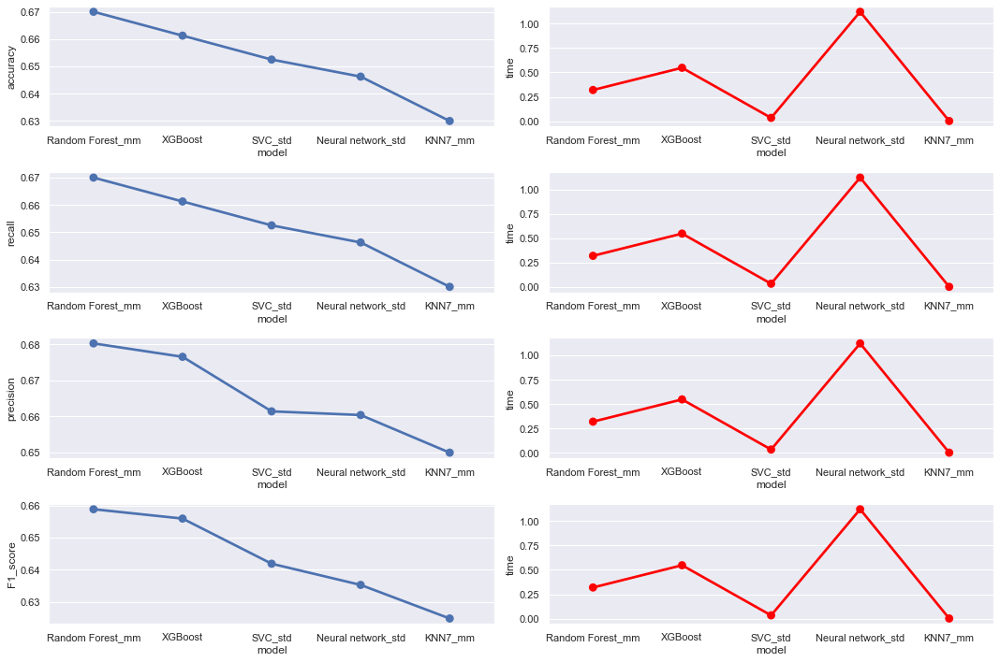

In [40]:
vis.plot_result_point(distinct_result)

In the plot above we can see performance of five best models for each metric with corresponding fitting time. We can see that neural networks take much time. Furthermore, for each metric we have the same set of models, which won. So for the next stage we pick up:
- K-Nearest Neighbors with 7 neighbors parameter
- Support Vector Machine
- Random Forest
- XGBoost
- Neural network

# Improve results

So in this step we will focus on improving best models.

### Hyperparameter tuning

We will start with tuning hyperparameters tuning. Every model has a different set of parameters. Depending on how we set them we can get different results. Unfortunately, we can obtain different results with different combination of parameters. Usually it is impossible to obtain perfect combination due to time and complexity. We have to rely on some intuition and trials. We define grids for concrete parameters and perform exhaustive grid search for each of them.

In [41]:
# defining 5 best models
svc = SVC()
knn = KNeighborsClassifier(n_neighbors=4)
rfc = RandomForestClassifier(max_depth = 25)
xgb = XGBClassifier(objective='multi:softprob', max_depth=25)
mlp = MLPClassifier((100, 100, 100), batch_size=16,
                    learning_rate='adaptive', early_stopping=True)

# parameters grid for Support vector machine
svc_grid = {'C': [0.1, 1, 10, 100, 1000, 10000],
            'kernel': ['linear', 'rbf']}

# parameters grid for K-nearest neighbor
knn_grid = {'n_neighbors': [3, 4, 5, 6],
            'p':[1, 2, 3, 4],
            'algorithm':['ball_tree', 'kd_tree', 'brute'],
            'leaf_size': [10, 20, 30, 40]}

# parameters grid for random forest 
rfc_grid = {'n_estimators': np.linspace(200, 1000, 4, dtype=int),
               'max_depth': np.linspace(10, 50, 4),
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4]}

# parameters grid for XGBoost
xgb_grid = {"learning_rate"    : [0.10, 0.20, 0.30 ] ,
             "max_depth"        : [8, 12, 15],
             "min_child_weight" : [ 1, 3, 5],
             "gamma"            : [ 0.0, 0.1],
             "colsample_bytree" : [ 0.3, 0.4, 0.7 ]}

# parameters grid for neural network
mlp_grid = {
    'hidden_layer_sizes': [(50,50,50, 50), (50,100,50, 30), (100, 100, 100, 100)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05, 0.001],
    'learning_rate': ['constant','adaptive']}

models = [('SVC', 'std', svc),
          ('KNN', 'mm', knn),
          ('Random Forest', 'mm', rfc),
          ('XGBoost', 'no', xgb),
          ('Neural network', 'std', mlp)]
grids = [svc_grid,
         knn_grid,
         rfc_grid,
         xgb_grid,
         mlp_grid]

In [42]:
def unpacking_tuned_measures(name, dictionary, idx):
    '''This function calculates mean of metrics and corresponding to them 
        standard deviation. Everything returned in nice dataframe. 
       
       Parameters
       -------------------
       name: string
           name of current model
       dictionary:  dict
           dict of calculated metrics
       idx:  index
           index of best performing model from grid search
      
       Returns
       ------------------
       pandas dataframe with metrics calculated for each model'''
    
    
    # calculating mean of metrics
    acc = dictionary['mean_test_accuracy'][idx]
    recall = dictionary['mean_test_recall_weighted'][idx]
    precision = dictionary['mean_test_precision_weighted'] [idx]  
    f1 = dictionary['mean_test_f1_weighted'][idx]
    time = dictionary['mean_fit_time'][idx]
    
    # calculating std of metrics
    std_acc = dictionary['std_test_accuracy'][idx]
    std_recall = dictionary['std_test_recall_weighted'][idx]
    std_precision = dictionary['std_test_precision_weighted'] [idx]  
    std_f1 = dictionary['std_test_f1_weighted'][idx]
    std_time = dictionary['std_fit_time'][idx]
    
    # returning row of dataframe
    return pd.DataFrame({'model':[name],
                       'accuracy':[acc],
                       'recall':[recall],
                       'precision':[precision],
                       'F1_score':[f1],
                       'time':[time],
                       'std_accuracy':[std_acc],
                       'std_recall':[std_recall],
                       'std_precision':[std_precision],
                       'std_F1_score':[std_f1],
                       'std_time':[std_time]})

In [43]:
def hyperparameter_tuning(models, grids, X, X_mm, X_std):
    '''This function takes bunch of models with their parameters grid and type of scaling
        which they are performing and use exhaustive gridsearch looking for best set of
        parameters. 
       
       Parameters
       -------------------
       models: list of tuples
           tuples contain name of the model, scaling type and model itself
       X:  array like
           it is a matrix of independent variables
       X_std:  array like
           it is a matrix of independent variables scaled with StandardScaler
       X_mm:  array like
           it is a matrix of independent variables scaled with MinMaxScaler
       grids: dict
          dict with model's parameters names and vector of used values

       Returns
       ------------------
       pandas dataframe with metrics calculated for each model,
       list of best performing models,
       list of uples with name and best parameters of models'''
    
    # empty dataframe
    df = pd.DataFrame({'model':[],
                       'accuracy':[],
                       'recall':[],
                       'precision':[],
                       'F1_score':[],
                       'time':[],
                       'std_accuracy':[],
                       'std_recall':[],
                       'std_precision':[],
                       'std_F1_score':[],
                       'std_time':[]})
    # our scoring metrics
    scoring = ['accuracy', 'recall_weighted',
               'precision_weighted', 'f1_weighted']

    # list for best models and params
    best_models = []
    best_params = []

    # iterating over model list and parameters grid
    for model_tuple, grid in zip(models, grids):
        # unpacking tuple
        name, scaling, model = model_tuple
        
        # choosing the scaling method, this time its min max
        if scaling == 'mm':
            # grid search with regards to accuracy
            grid_search = GridSearchCV(
                model, grid, cv=7,
                scoring=scoring, refit='accuracy')
            # fitting model
            grid_search.fit(X_mm, y)
            # appending important statistics
            best_models.append(grid_search.best_estimator_)
            best_params.append((name, grid_search.best_params_))
            
            # index of best model in the fitting queue
            idx = grid_search.best_index_
            # calculating statistics
            row = unpacking_tuned_measures(name, grid_search.cv_results_, idx)
            df = df.append(row, ignore_index=True)
            print(name, grid_search.best_params_)
        
        # Standard scaling method
        elif scaling == 'std':
            # grid search with regards to accuracy
            grid_search = GridSearchCV(
                model, grid, cv=7, 
                scoring=scoring, refit='accuracy')
            # fitting model
            grid_search.fit(X_std, y)

            # appending important statistics
            best_models.append(grid_search.best_estimator_)
            best_params.append((name, grid_search.best_params_))
            # index of best model in the fitting queue
            idx = grid_search.best_index_
            # calculating statistics
            row = unpacking_tuned_measures(name, grid_search.cv_results_, idx)
            df = df.append(row, ignore_index=True)
            print(name, grid_search.best_params_)
        
        # without scaling
        else:
            # grid search with regards to accuracy
            grid_search = GridSearchCV(
                model, grid, cv=7,
                scoring=scoring, refit='accuracy')
            # fitting model
            grid_search.fit(X, y)
            # appending important statistics
            best_models.append(grid_search.best_estimator_)
            best_params.append((name, grid_search.best_params_))
            # index of best model in the fitting queue
            idx = grid_search.best_index_
            # calculating statistics
            row = unpacking_tuned_measures(name, grid_search.cv_results_, idx)
            df = df.append(row, ignore_index=True)
            print(name, grid_search.best_params_)

    
    return df, best_models, best_params

Below there are obtained combinations.

In [44]:
result, best_models, best_params = hyperparameter_tuning(models, grids, X, X_mm_scaled, X_std_scaled)

SVC {'C': 10, 'kernel': 'rbf'}
KNN {'algorithm': 'ball_tree', 'leaf_size': 10, 'n_neighbors': 6, 'p': 1}
Random Forest {'max_depth': 50.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 733}
XGBoost {'colsample_bytree': 0.7, 'gamma': 0.0, 'learning_rate': 0.2, 'max_depth': 8, 'min_child_weight': 3}
Neural network {'activation': 'tanh', 'alpha': 0.0001, 'hidden_layer_sizes': (50, 100, 50, 30), 'learning_rate': 'constant', 'solver': 'adam'}


And there we can see the results.

In [45]:
result

,model,accuracy,recall,precision,F1_score,time,std_accuracy,std_recall,std_precision,std_F1_score,std_time
0,SVC,0.671298,0.671298,0.685634,0.667111,0.034199,0.021102,0.021102,0.026585,0.023546,0.001752
1,KNN,0.638804,0.638804,0.647890,0.626737,0.002989,0.042320,0.042320,0.045103,0.044669,0.000013
2,Random Forest,0.673782,0.673782,0.679791,0.666519,1.960620,0.029889,0.029889,0.030449,0.030740,0.035804
3,XGBoost,0.662537,0.662537,0.668326,0.657313,0.417455,0.020749,0.020749,0.025808,0.023057,0.005459
4,Neural network,0.652544,0.652544,0.662191,0.644899,0.986274,0.045734,0.045734,0.058938,0.051736,0.226096


In [46]:
best_params

[('SVC', {'C': 10, 'kernel': 'rbf'}),
 ('KNN',
  {'algorithm': 'ball_tree', 'leaf_size': 10, 'n_neighbors': 6, 'p': 1}),
 ('Random Forest',
  {'max_depth': 50.0,
   'min_samples_leaf': 1,
   'min_samples_split': 2,
   'n_estimators': 733}),
 ('XGBoost',
  {'colsample_bytree': 0.7,
   'gamma': 0.0,
   'learning_rate': 0.2,
   'max_depth': 8,
   'min_child_weight': 3}),
 ('Neural network',
  {'activation': 'tanh',
   'alpha': 0.0001,
   'hidden_layer_sizes': (50, 100, 50, 30),
   'learning_rate': 'constant',
   'solver': 'adam'})]

A good option is to compare them to the previous one. Let's put everything on single point plot. We can see, that Every algorithm improved a bit their accuracy. Only the XGBoost got worse precision than before. But it is fine that we get something better than before.

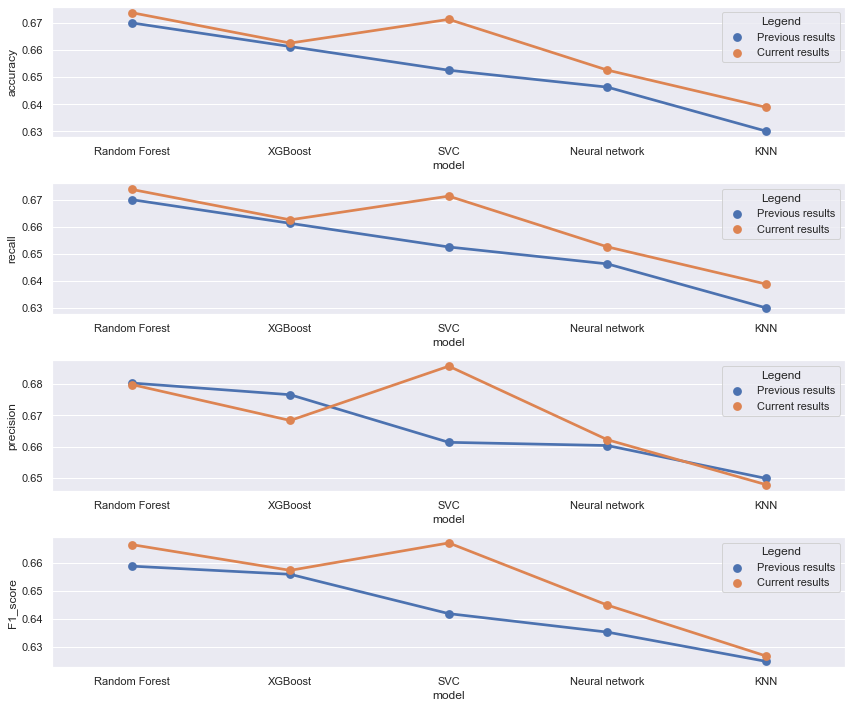

In [49]:
vis.plot_result_point(distinct_result, w_time=False, result_best=result)

In [50]:
# Support vector machine
svc = SVC(C=100)
svc_pipe = Pipeline([('scaler', StandardScaler()), ('svc', svc)])

# K nearest neighbors
knn = KNeighborsClassifier(n_neighbors=6, p=1, leaf_size=10, algorithm='ball_tree')
knn_pipe = Pipeline([('scaler', MinMaxScaler()), ( 'knn', knn)])

# Random Forest 
rfc = RandomForestClassifier(max_depth =50, min_samples_leaf=1, min_samples_split=2, n_estimators=733)
rfc_pipe = Pipeline([('scaler', MinMaxScaler()), ( 'rfc', rfc)])


#XGBoost
xgb = XGBClassifier(objective='multi:softprob', max_depth=8, gamma=0, colsample_bytree=0.7,
                    learning_rate=0.2, min_child_weight=3)

# Neural network
mlp = MLPClassifier((50, 100, 50, 30), batch_size=16, alpha=0.0001,
                    learning_rate='constant', early_stopping=True, activation='tanh')
mlp_pipe = Pipeline([('scaler', StandardScaler()), ( 'mlp', mlp)])

# models list
models = [('SVC', svc_pipe),
          ('KNN', knn_pipe),
          ('Random Forest', rfc),
          ('XGBoost', xgb),
          ('Neural network', mlp_pipe)]

#### Ensemble methods

For now the best obtained result is 67.3% accuracy which is a bit poor. Of course not like the dummy classifier but still, it is poor. We can try to use ensemble methods. They will take as an argument list of our current models and based on their predictions they will make their own prediction. As in real life, if more than one person admit something we have more certainty that something is right. <br>
We will start with voting classifier, which as the name suggests takes votes from every model and based on the number of votes on given class it gives predictions. 

In [51]:
# Voting classifier
voting_classifier = VotingClassifier(models)
voting_classifier.fit(X, y)

# needed scorers
scoring = ['accuracy', 'recall_weighted', 'precision_weighted', 'f1_weighted']
# 10 fold cross-validation
ensemble_result = cross_validate(voting_classifier, X, y, cv=10, scoring=scoring)

# print results
unpacking_measures_dict('Voting Classifier', ensemble_result)

,model,accuracy,recall,precision,F1_score,time
0,Voting Classifier,0.6925,0.6925,0.708099,0.683146,3.803133


We get another 2 percent points. We can also check stacked classifier, which works a bit differently from the previous one. We queue up our models and each model's output is used to the next model's input. On the top we are using Logistic regression to determine the final prediction.

In [52]:
# Stacked classifier
stacked_classifier = StackingClassifier(models, final_estimator=LogisticRegression(max_iter=5000), cv=10)
stacked_classifier.fit(X, y)

# 10 fold cross-validation
stacked_result = cross_validate(voting_classifier, X, y, cv=10, scoring=scoring)

# print results
unpacking_measures_dict('Stacking Classifier', stacked_result)

,model,accuracy,recall,precision,F1_score,time
0,Stacking Classifier,0.69875,0.69875,0.715433,0.689889,3.710869


Not much better but we get another half percent.

### Extreme feature engineering

To this moment we use a lot of tools and methods and we know which result we can obtained. Now we will come back to the origin, to our data. We should try to extract something more from them. For that purpose we will perform more feature engineering. We will create even more features and not only mean and standard deviations from them but also minimum and maximum.

In [53]:
def extra_feature_extract(df, X_mm):
    '''Function to extract certain features from dataframe
    containing path do audio file
    -------
    return dataframe'''
    
    '''This function is an extension of previous feature engineering and it should return 
        a dataframe containing 102 columns. 
       
       Parameters
       -------------------
       df: pandas dataframe
           dataframe which contain path to audio file
       X_mm:  array like
           it is a matrix of independent variables scaled with MinMaxScaler used
           for KMeans clustering
       Returns
       ------------------
       pandas dataframe with calculated features'''
    
    # iterating over index and path to file
    km = KMeans(n_clusters=10)
    df['kmeans'] = km.fit_predict(X_mm)
    
    for i, file in zip(df.index, df.file):
        # creating wave
        x, sr = librosa.load(file)
        
        # basic statistics of wave
        df.loc[i, 'wave_std'] = np.std(x)
        df.loc[i, 'wave_mean'] = np.mean(x)
        df.loc[i, 'wave_min'] = np.min(x)
        df.loc[i, 'wave_max'] = np.max(x)
        
        # Preparing the frequency in decibel
        X = librosa.stft(x)
        Xdb = librosa.amplitude_to_db(np.abs(X))
        df.loc[i, 'db_mean'] = np.mean(Xdb)
        df.loc[i, 'db_std'] = np.std(Xdb)
        df.loc[i, 'db_min'] = np.min(Xdb)
        df.loc[i, 'db_max'] = np.max(Xdb)

        # zero crossings
        cross_rate = librosa.feature.zero_crossing_rate(x)
        df.loc[i, 'zero_crossing'] = np.sum(librosa.zero_crossings(x))
        df.loc[i, 'zero_crossing_rate_mean'] = np.mean(cross_rate)
        df.loc[i, 'zero_crossing_rate_min'] = np.min(cross_rate)
        df.loc[i, 'zero_crossing_rate_max'] = np.max(cross_rate)
        df.loc[i, 'zero_crossing_rate_std'] = np.std(cross_rate)


        # spectral rolloff
        spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=sr)
        df.loc[i, 'spectral_rolloff_mean'] = np.mean(spectral_rolloff)
        df.loc[i, 'spectral_rolloff_std'] = np.std(spectral_rolloff)    
        df.loc[i, 'spectral_rolloff_min'] = np.min(spectral_rolloff)
        df.loc[i, 'spectral_rolloff_max'] = np.max(spectral_rolloff) 
        
        # rms
        rms = librosa.feature.rms(x)
        df.loc[i, 'rms_mean'] = np.mean(rms)
        df.loc[i, 'rms_std'] = np.std(rms)    
        df.loc[i, 'rms_min'] = np.min(rms)
        df.loc[i, 'rms_max'] = np.max(rms) 
        
        # spectral_centroid
        spectral_centroid = librosa.feature.spectral_centroid(x)
        df.loc[i, 'spectral_centroid_mean'] = np.mean(spectral_centroid)
        df.loc[i, 'spectral_centroid_std'] = np.std(spectral_centroid)    
        df.loc[i, 'spectral_centroid_min'] = np.min(spectral_centroid)
        df.loc[i, 'spectral_centroid_max'] = np.max(spectral_centroid) 
        
        # spectral bandwitdh
        spectral_bandwidth = librosa.feature.spectral_bandwidth(x)
        df.loc[i, 'spectral_bandwidth_mean'] = np.mean(spectral_bandwidth)
        df.loc[i, 'spectral_bandwidth_std'] = np.std(spectral_bandwidth)    
        df.loc[i, 'spectral_bandwidth_min'] = np.min(spectral_bandwidth)
        df.loc[i, 'spectral_bandwidth_max'] = np.max(spectral_bandwidth)
        
        # spectral contrast
        spectral_contrast = librosa.feature.spectral_contrast(x)
        df.loc[i, 'spectral_contrast_mean'] = np.mean(spectral_contrast)
        df.loc[i, 'spectral_contrast_std'] = np.std(spectral_contrast)    
        df.loc[i, 'spectral_contrast_min'] = np.min(spectral_contrast)
        df.loc[i, 'spectral_contrast_max'] = np.max(spectral_contrast)
        
        # spectral flatness
        spectral_flatness = librosa.feature.spectral_flatness(x)
        df.loc[i, 'spectral_flatness_mean'] = np.mean(spectral_flatness)
        df.loc[i, 'spectral_flatness_std'] = np.std(spectral_flatness)    
        df.loc[i, 'spectral_flatness_min'] = np.min(spectral_flatness)
        df.loc[i, 'spectral_flatness_max'] = np.max(spectral_flatness)
        
        # poly features
        poly_features = librosa.feature.poly_features(x)
        for feat in range(len(poly_features)):
            df.loc[i, 'poly_features_mean'+str(feat)] = np.mean(poly_features[feat])
            df.loc[i, 'poly_features_std'+str(feat)] = np.std(poly_features[feat])    
            df.loc[i, 'poly_features_min'+str(feat)] = np.min(poly_features[feat])
            df.loc[i, 'poly_features_max'+str(feat)] = np.max(poly_features[feat])
       
        tonnetz = librosa.feature.tonnetz(x)
        for feat in range(len(tonnetz)):
            df.loc[i, 'tonnetz_mean'+str(feat)] = np.mean(tonnetz[feat])
            df.loc[i, 'tonnetz_std'+str(feat)] = np.std(tonnetz[feat])    
            df.loc[i, 'tonnetz_min'+str(feat)] = np.min(tonnetz[feat])
            df.loc[i, 'tonnetz_max'+str(feat)] = np.max(tonnetz[feat])
            
        # mfcc features
        mfccs = librosa.feature.mfcc(x, sr=sr, n_mfcc=30)
        # iterating over 30 mfcc features
        for feat, mfcc in enumerate(mfccs):
            df.loc[i, 'mfcc_'+str(feat+1)] = np.mean(mfcc)
        
        
    return df

In [54]:
# reseting train and test dataframes by concatenating train test split arrays
train = pd.concat([X_train, y_train], axis=1)
test = pd.concat([X_test, y_test], axis=1)

# Performing feature engineering
train = extra_feature_extract(train, X_mm_scaled)

So we create 75 more columns. This number is not bad. But as we can remember we performed feature selection before learning. We have to do it also for now.

In [55]:
train

,file,label,kmeans,wave_std,wave_mean,wave_min,wave_max,db_mean,db_std,db_min,...,mfcc_21,mfcc_22,mfcc_23,mfcc_24,mfcc_25,mfcc_26,mfcc_27,mfcc_28,mfcc_29,mfcc_30
935,data\genres\rock\rock.00003.wav,rock,4,0.163970,-0.000012,-1.000000,0.999939,-15.175387,14.819819,-34.122398,...,-4.116312,-3.470074,-1.504178,-0.125199,2.438840,-3.056894,-1.544359,-3.376257,-0.515387,-4.194211
662,data\genres\hiphop\hiphop.00053.wav,hiphop,9,0.115207,-0.000024,-0.798248,0.710907,-8.449903,11.775224,-39.263653,...,0.150990,-0.872215,-0.735763,-1.120020,-0.679984,-2.141607,-0.945125,-1.980658,-2.016414,-1.801714
277,data\genres\reggae\reggae.00030.wav,reggae,4,0.088561,-0.000015,-0.882935,0.789398,-19.831137,14.580263,-38.815575,...,-7.253394,-0.006355,1.541034,-1.620572,-3.927643,-0.680693,-1.381010,-2.018647,-6.123237,-3.422366
166,data\genres\hiphop\hiphop.00033.wav,hiphop,1,0.221244,-0.001427,-0.813843,0.816620,-0.152441,11.435061,-33.949276,...,-2.958741,-1.232363,-3.816887,-1.201879,-4.253294,-0.843839,-4.022229,-0.933967,-3.227596,-2.262534
190,data\genres\country\country.00083.wav,country,0,0.137847,-0.000022,-0.839996,0.882965,-16.512728,16.154051,-37.280651,...,0.883106,2.704026,-2.051773,-2.692982,-2.399995,-1.891434,-1.756205,0.405028,1.661950,-2.272621
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,data\genres\jazz\jazz.00099.wav,jazz,4,0.044330,-0.000032,-0.357330,0.309570,-28.270460,12.326286,-41.498615,...,-2.326305,1.374412,-2.483137,1.404796,0.779596,-9.650432,-0.792672,-4.012369,-0.357058,-5.635752
30,data\genres\disco\disco.00007.wav,disco,1,0.174314,-0.000021,-0.986755,0.943268,-1.977001,11.410687,-34.132153,...,1.411227,1.176374,0.711678,-1.926441,-1.167293,1.594974,-0.591029,-0.741532,-1.513998,-2.649915
644,data\genres\jazz\jazz.00066.wav,jazz,2,0.177340,-0.001440,-0.714569,0.676422,-13.911277,13.773616,-37.055504,...,-0.068182,1.588992,0.764246,-0.038224,-1.915555,1.276172,-2.958231,-1.274598,-1.485582,0.567716
650,data\genres\classical\classical.00004.wav,classical,2,0.044730,-0.000159,-0.265045,0.295746,-27.174587,14.882059,-42.910961,...,6.588086,4.766327,3.674422,0.371434,3.283812,4.296852,9.097978,6.102889,3.959143,-5.265430


In [57]:
train['label'] = train['label'].astype('category')

### Feature importance

We will start with creating an instance of numeric features.

In [58]:
# Extracting numeric features
train_num = train.drop(['file', 'label'], axis=1)

In [59]:
train_num

,kmeans,wave_std,wave_mean,wave_min,wave_max,db_mean,db_std,db_min,db_max,zero_crossing,...,mfcc_21,mfcc_22,mfcc_23,mfcc_24,mfcc_25,mfcc_26,mfcc_27,mfcc_28,mfcc_29,mfcc_30
935,4,0.163970,-0.000012,-1.000000,0.999939,-15.175387,14.819819,-34.122398,45.877602,28563.0,...,-4.116312,-3.470074,-1.504178,-0.125199,2.438840,-3.056894,-1.544359,-3.376257,-0.515387,-4.194211
662,9,0.115207,-0.000024,-0.798248,0.710907,-8.449903,11.775224,-39.263653,40.736347,70991.0,...,0.150990,-0.872215,-0.735763,-1.120020,-0.679984,-2.141607,-0.945125,-1.980658,-2.016414,-1.801714
277,4,0.088561,-0.000015,-0.882935,0.789398,-19.831137,14.580263,-38.815575,41.184425,46716.0,...,-7.253394,-0.006355,1.541034,-1.620572,-3.927643,-0.680693,-1.381010,-2.018647,-6.123237,-3.422366
166,1,0.221244,-0.001427,-0.813843,0.816620,-0.152441,11.435061,-33.949276,46.050724,101847.0,...,-2.958741,-1.232363,-3.816887,-1.201879,-4.253294,-0.843839,-4.022229,-0.933967,-3.227596,-2.262534
190,0,0.137847,-0.000022,-0.839996,0.882965,-16.512728,16.154051,-37.280651,42.719349,39467.0,...,0.883106,2.704026,-2.051773,-2.692982,-2.399995,-1.891434,-1.756205,0.405028,1.661950,-2.272621
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,4,0.044330,-0.000032,-0.357330,0.309570,-28.270460,12.326286,-41.498615,38.501385,30611.0,...,-2.326305,1.374412,-2.483137,1.404796,0.779596,-9.650432,-0.792672,-4.012369,-0.357058,-5.635752
30,1,0.174314,-0.000021,-0.986755,0.943268,-1.977001,11.410687,-34.132153,45.867847,92985.0,...,1.411227,1.176374,0.711678,-1.926441,-1.167293,1.594974,-0.591029,-0.741532,-1.513998,-2.649915
644,2,0.177340,-0.001440,-0.714569,0.676422,-13.911277,13.773616,-37.055504,42.944496,59038.0,...,-0.068182,1.588992,0.764246,-0.038224,-1.915555,1.276172,-2.958231,-1.274598,-1.485582,0.567716
650,2,0.044730,-0.000159,-0.265045,0.295746,-27.174587,14.882059,-42.910961,37.089039,74801.0,...,6.588086,4.766327,3.674422,0.371434,3.283812,4.296852,9.097978,6.102889,3.959143,-5.265430


Let's calculate feature importance and visualize them.

In [60]:
# Decision tree feature importance
dtc = DecisionTreeClassifier()
dtc_importance = importances_calculation(dtc, train_num, train['label'])

# Random forest feature importance
rfc = RandomForestClassifier()
rfc_importance = importances_calculation(rfc, train_num, train['label'])

# XGBoost feature importance
xgb_c = XGBClassifier()
xgb_importance = importances_calculation(xgb_c, train_num, train['label'])

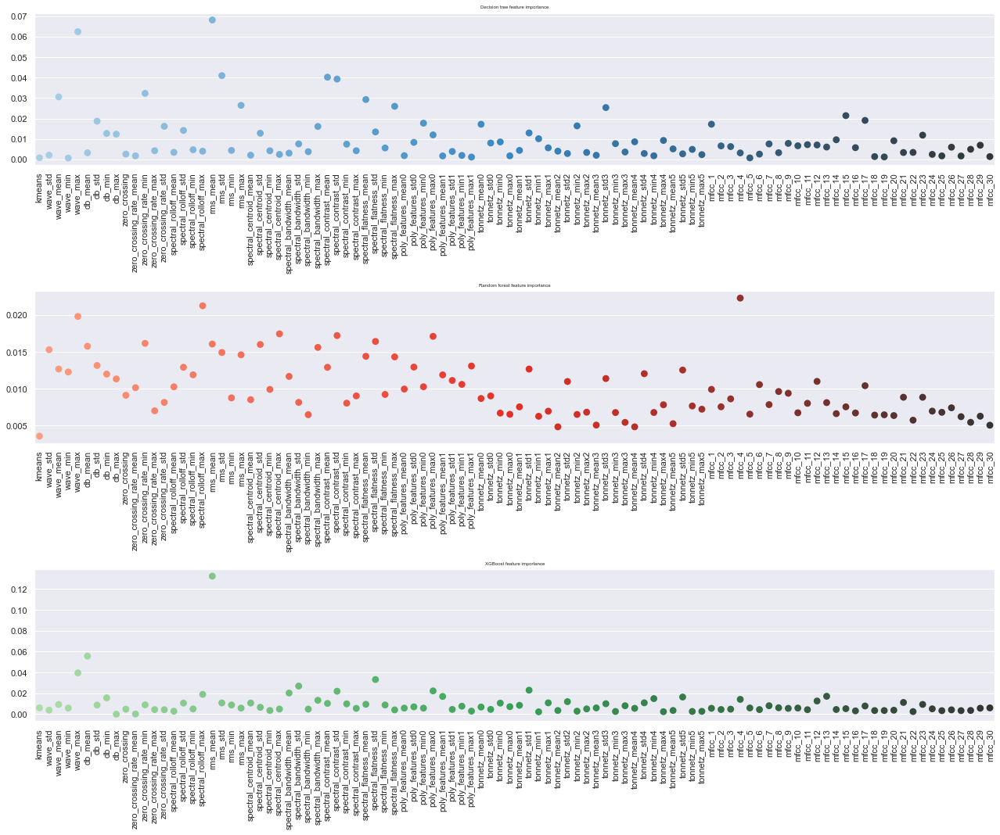

In [61]:
vis.draw_point_importance(train_num.columns, dtc_importance, rfc_importance, xgb_importance)

As previous most of features have similar feature importance and we observe only some of them with larger value. For now we leave them and take a look on correlation matrix one more time.

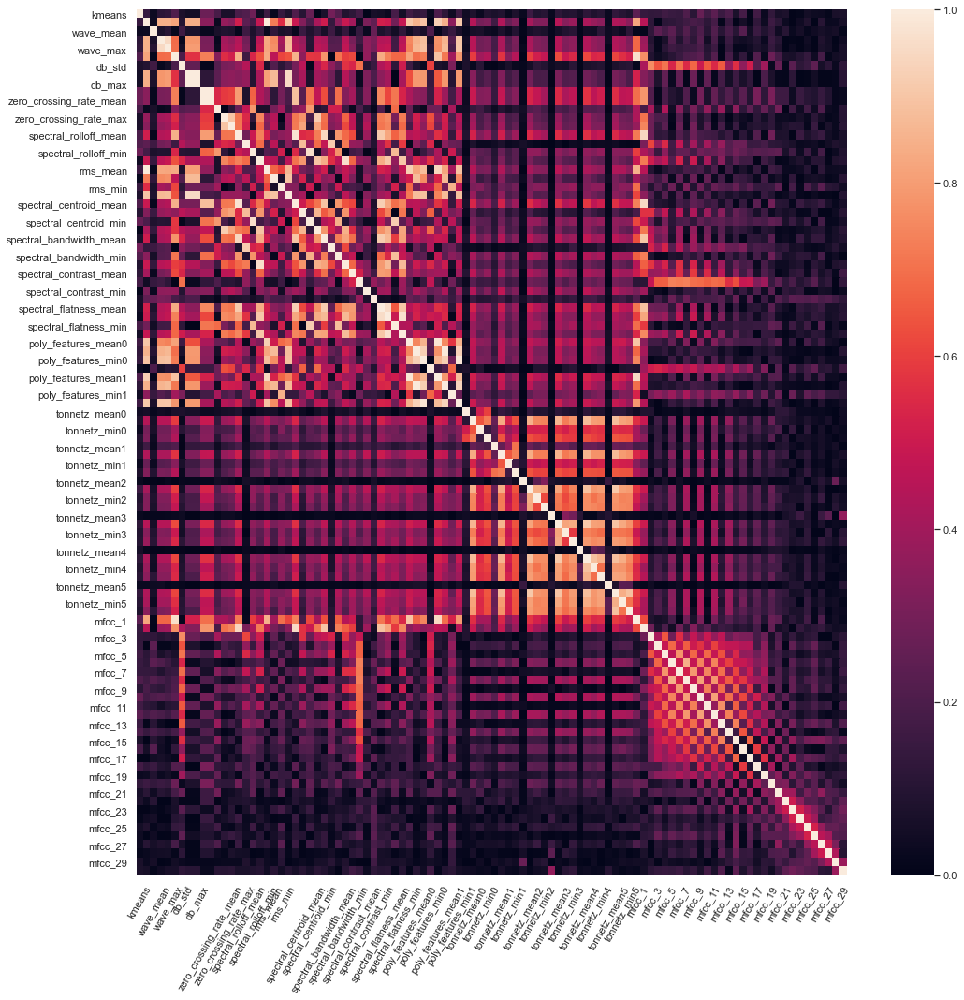

In [62]:
corr_mat = np.abs(train_num.corr(method='spearman'))
plt.figure(figsize=(17, 17))
# spearman correlation
sns.heatmap(corr_mat, vmin=0, vmax=1)
plt.xticks(rotation=60)
plt.show()

There are many more columns with very high correlation. It could be a problem to find each pair of high correlated columns and compare which one of them has better feature importance. Because of that we will automate this process.

### Feature Selection

Function bellow search for pairs of columns with absolute correlation exceed 0.9. Then it checks which one has greater feature importance and appends the second one on the list with columns to remove.

In [63]:
def drop_high_correleation(corr_mat, feature_importance):
    '''This function at first extract pairs of columns which are correlated higher or equal than 0.9.
        Then select to drop this one which has smaller mean of feature importance 
       
       Parameters
       -------------------
       corr mat:  array like
           correlation matrix of dataframe
       feature_importance:  array like
           list of averaged feature importances

       Returns
       ------------------
       list of columns to drop from dataframe'''
    
    # crating only upper triangle from correlation matrix
    upper_tri = corr_mat.where(np.triu(np.ones(corr_mat.shape),k=1).astype(np.bool))
    # selecting those columns whose correlation is above 0.9
    correlated_columns = [(row, col) for row in upper_tri.index 
                          for col in upper_tri.columns 
                          if upper_tri.loc[row, col] >= 0.90]
    
    # empty list
    columns_to_drop = []
    
    # iterating over each remained combination of columns
    for row, col in correlated_columns:
        # if any of them were droped we can leave this moment
        if (not row in columns_to_drop) and (not col in columns_to_drop):
            row_importance = feature_importance[row]
            col_importance = feature_importance[col]
            
            # appending column with higher feature importance
            if row_importance >= col_importance:
                columns_to_drop.append(col)
            else:
                columns_to_drop.append(row)
        else:
            continue
    
    print('Number of columns to drop: ', len(columns_to_drop))

    return columns_to_drop

Because depending on the algorithm we chose to calculate importance the result may differ, so we will take average of importance from every method and pass it to the function.

In [64]:
# mean of dtc, rfc and xgb feature importance
mean_importance = np.mean(np.vstack([dtc_importance, rfc_importance, xgb_importance]), axis=0)
# creating dict of column names and corresponding feature importance
importance_dict = dict(zip(train_num.columns, mean_importance))

As we can see, we have dropped 22 columns. How will look correlation matrix now?

In [65]:
# creating list of columns to drop
columns_to_drop = drop_high_correleation(corr_mat, importance_dict)
# droping high correlated columns
train_num = train_num.drop(columns_to_drop, axis=1)

Number of columns to drop:  22


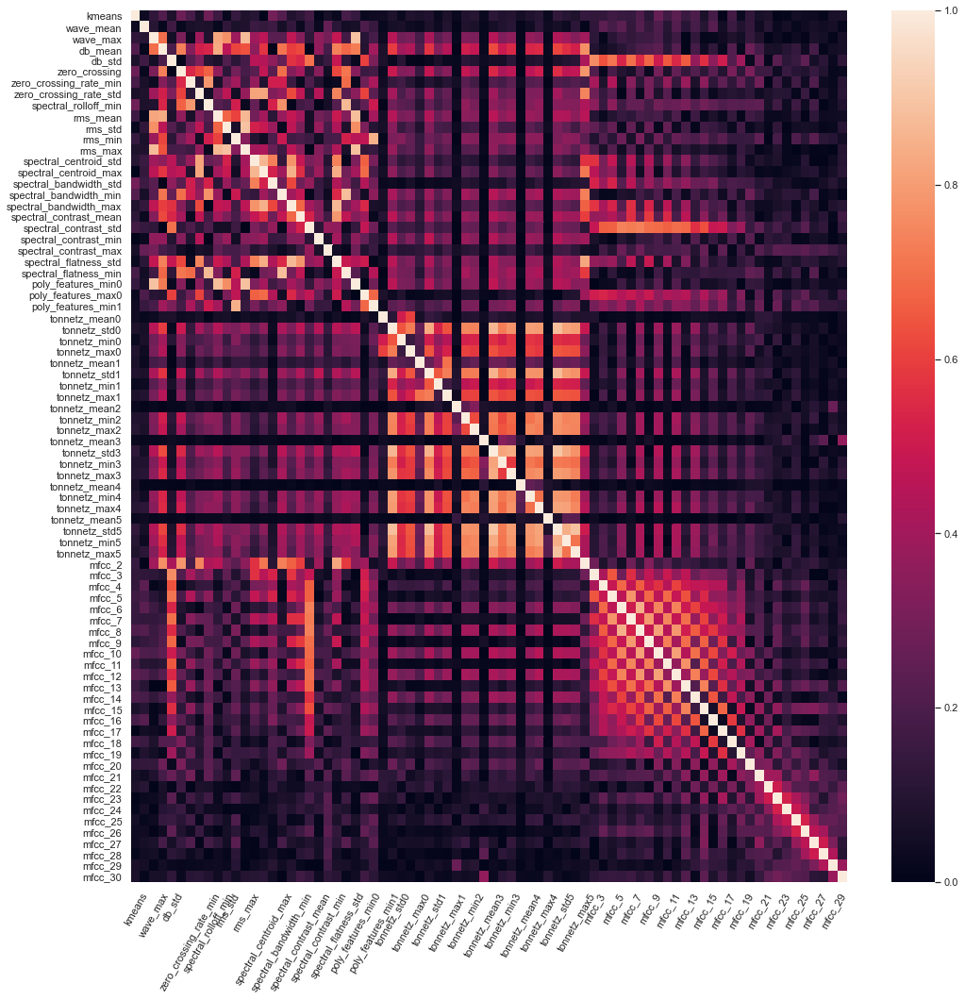

In [66]:
corr_mat = np.abs(train_num.corr(method='spearman'))
plt.figure(figsize=(17, 17))
# spearman correlation
sns.heatmap(corr_mat, vmin=0, vmax=1)
plt.xticks(rotation=60)
plt.show()

It is still bright in some places but we removed very high values from it and 22 columns are more than 20% overall number of columns. We can move to model our current data and for that we start with scaling it.

In [67]:
X, y = train_num, train['label']

# defining scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()

# scaling
X_std_scaled = standard_scaler.fit_transform(X)
X_mm_scaled = minmax_scaler.fit_transform(X)

#### Hyperparameter tuning after feature engineering

We will use the same best five algorithms from before and one more time define grids of parameters.

In [68]:
# defining 5 best models
svc = SVC()
knn = KNeighborsClassifier(n_neighbors=4)
rfc = RandomForestClassifier(max_depth = 25)
xgb = XGBClassifier(objective='multi:softprob', max_depth=25)
mlp = MLPClassifier((100, 100, 100), batch_size=16,
                    learning_rate='adaptive', early_stopping=True)

# parameters grid for Support vector machine
svc_grid = {'C': [10, 100, 150, 200, 300, 1000],
            'kernel': ['linear', 'rbf', 'poly', 'sigmoid']}

# parameters grid for K-nearest neighbor
knn_grid = {'n_neighbors': [4, 5, 6, 7],
            'p':[1, 2, 3],
            'algorithm':['ball_tree', 'kd_tree', 'brute'],
            'leaf_size': [10, 13, 15, 20, 25]}

# parameters grid for random forest 
rfc_grid = {'n_estimators': np.linspace(100, 500, 4, dtype=int),
               'max_depth': np.linspace(10, 40, 4),
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4]}

# parameters grid for XGBoost
xgb_grid = {"learning_rate"    : [0.05, 0.10, 0.15] ,
             "max_depth"        : [5, 8, 10],
             "min_child_weight" : [ 1, 2, 3],
             "gamma"            : [ 0.0, 0.1],
             "colsample_bytree" : [ 0.2, 0.25, 0.3, 0.35]}

# parameters grid for neural network
mlp_grid = {
    'hidden_layer_sizes': [(200, 200, 150, 100), (300, 250, 150, 100), (100, 100, 100, 100)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05, 0.001, 0.04, 0.07],
    'learning_rate': ['constant','adaptive']}

# model list
models = [('SVC', 'std', svc),
          ('KNN', 'mm', knn),
          ('Random Forest', 'mm', rfc),
          ('XGBoost', 'no', xgb),
          ('Neural network', 'std', mlp)]

# model's parameters grids
grids = [svc_grid,
         knn_grid,
         rfc_grid,
         xgb_grid,
         mlp_grid]

These are best combinations of parameters after performing exhaustive grid search. We can observe that they does'nt change from before at all.

In [69]:
result_after_engineering, best_models_after_engineering, \
best_params_after_engineering = hyperparameter_tuning(models, grids, X, X_mm_scaled, X_std_scaled)

SVC {'C': 10, 'kernel': 'rbf'}
KNN {'algorithm': 'ball_tree', 'leaf_size': 10, 'n_neighbors': 5, 'p': 1}
Random Forest {'max_depth': 30.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}
XGBoost {'colsample_bytree': 0.2, 'gamma': 0.0, 'learning_rate': 0.15, 'max_depth': 8, 'min_child_weight': 1}
Neural network {'activation': 'tanh', 'alpha': 0.0001, 'hidden_layer_sizes': (200, 200, 150, 100), 'learning_rate': 'constant', 'solver': 'adam'}


In [71]:
best_params_after_engineering

[('SVC', {'C': 10, 'kernel': 'rbf'}),
 ('KNN',
  {'algorithm': 'ball_tree', 'leaf_size': 10, 'n_neighbors': 5, 'p': 1}),
 ('Random Forest',
  {'max_depth': 30.0,
   'min_samples_leaf': 1,
   'min_samples_split': 2,
   'n_estimators': 500}),
 ('XGBoost',
  {'colsample_bytree': 0.25,
   'gamma': 0.0,
   'learning_rate': 0.15,
   'max_depth': 5,
   'min_child_weight': 1}),
 ('Neural network',
  {'activation': 'tanh',
   'alpha': 0.05,
   'hidden_layer_sizes': (200, 200, 150, 100),
   'learning_rate': 'adaptive',
   'solver': 'adam'})]

The results are much better than before. We reached scores greater than 70% which is great. Let's compare it with previous results.

In [74]:
result_after_engineering

,model,accuracy,recall,precision,F1_score,time,std_accuracy,std_recall,std_precision,std_F1_score,std_time
0,SVC,0.743838,0.743838,0.753313,0.741061,0.033902,0.053504,0.053504,0.055523,0.056044,0.000767
1,KNN,0.672584,0.672584,0.691375,0.668581,0.005557,0.036007,0.036007,0.035868,0.033354,0.000495
2,Random Forest,0.727536,0.727536,0.736719,0.725533,1.996093,0.027398,0.027398,0.033331,0.029341,0.135876
3,XGBoost,0.742552,0.742552,0.749678,0.738309,0.551918,0.027018,0.027018,0.025764,0.027988,0.007645
4,Neural network,0.740057,0.740057,0.742662,0.734042,3.701597,0.057647,0.057647,0.055678,0.059622,0.966339


So as we can see below, after performing a bit of feature engineering our models completely outmatched the results from before. It shows how important this phase is and how we well we can improve performance by providing good features.

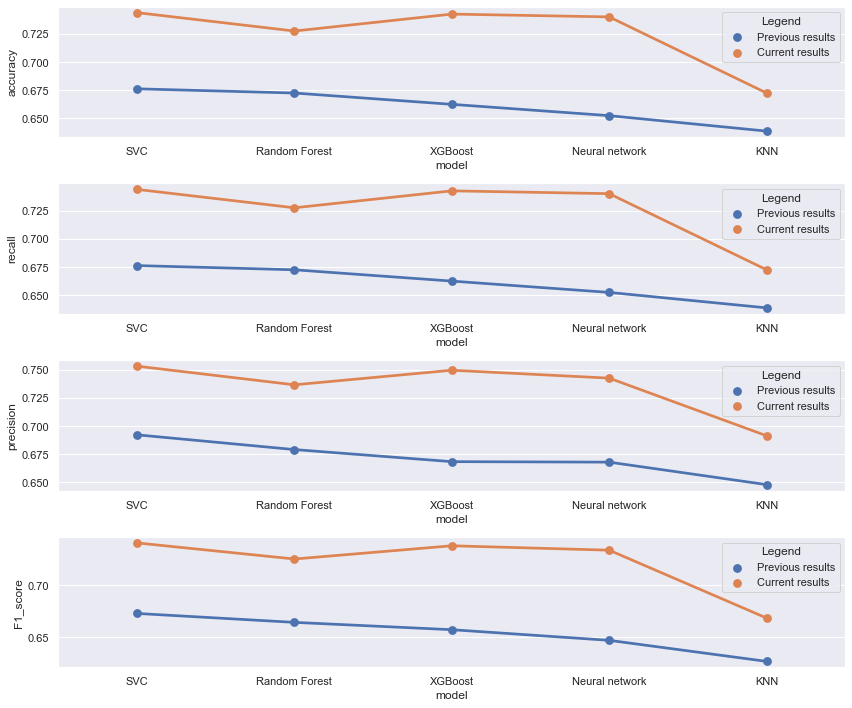

In [75]:
vis.plot_result_point(result, w_time=False, result_best=result_after_engineering)

We can carry out grid search one more time, but with more adjusted parameters grids. We will check values, which are near to the best combination from before. With that we can possibly find more accurate sets.

In [80]:
# defining 5 best models
svc = SVC()
knn = KNeighborsClassifier(n_neighbors=4)
rfc = RandomForestClassifier(max_depth = 25)
xgb = XGBClassifier(objective='multi:softprob', max_depth=25)
mlp = MLPClassifier((100, 100, 100), batch_size=16,
                    learning_rate='adaptive', early_stopping=True)

# parameters grid for Support vector machine
svc_grid = {'C': np.linspace(1, 30, 100),
            'kernel': ['rbf']}

# parameters grid for K-nearest neighbor
knn_grid = {'n_neighbors': [5],
            'p':[1],
            'algorithm':['ball_tree'],
            'leaf_size': [7, 8, 9, 10, 11, 12, 13, 14]}

# parameters grid for random forest 
rfc_grid = {'n_estimators': [355, 360, 366, 370],
               'max_depth': [16, 18, 20, 22, 24, 26],
               'min_samples_split': [2, 3],
               'min_samples_leaf': [1]}

# parameters grid for XGBoost
xgb_grid = {"learning_rate"    : [0.15, 0.17, 0.25] ,
             "max_depth"        : [7, 8, 9],
             "min_child_weight" : [3, 4, 5],
             "gamma"            : [0.1],
             "colsample_bytree" : [ 0.1, 0.15, 0.2, 0.23]}

# parameters grid for neural network
mlp_grid = {
    'hidden_layer_sizes': [(200, 200, 150, 100)],
    'activation': ['tanh'],
    'solver': ['adam'],
    'alpha': [0.02, 0.03, 0.04, 0.045, 0.05, 0.06],
    'learning_rate': ['adaptive']}

# list of models
models = [('SVC', 'std', svc),
          ('KNN', 'mm', knn),
          ('Random Forest', 'mm', rfc),
          ('XGBoost', 'no', xgb),
          ('Neural network', 'std', mlp)]

# list of model's parameters grids
grids = [svc_grid,
         knn_grid,
         rfc_grid,
         xgb_grid,
         mlp_grid]

Combinations changed a bit.

In [81]:
result_after_engineering_targ_hyp, best_models_after_engineering_targ_hyp, \
best_params_after_engineering_targ_hyp = hyperparameter_tuning(models, grids, X, X_mm_scaled, X_std_scaled)

SVC {'C': 3.3434343434343434, 'kernel': 'rbf'}
KNN {'algorithm': 'ball_tree', 'leaf_size': 7, 'n_neighbors': 5, 'p': 1}
Random Forest {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 366}
XGBoost {'colsample_bytree': 0.15, 'gamma': 0.1, 'learning_rate': 0.17, 'max_depth': 9, 'min_child_weight': 3}
Neural network {'activation': 'tanh', 'alpha': 0.03, 'hidden_layer_sizes': (200, 200, 150, 100), 'learning_rate': 'adaptive', 'solver': 'adam'}


In [82]:
result_after_engineering_targ_hyp

,model,accuracy,recall,precision,F1_score,time,std_accuracy,std_recall,std_precision,std_F1_score,std_time
0,SVC,0.761284,0.761284,0.768257,0.757848,0.044731,0.049979,0.049979,0.047352,0.050832,0.006820
1,KNN,0.673804,0.673804,0.691721,0.666641,0.002232,0.024741,0.024741,0.026238,0.025012,0.005467
2,Random Forest,0.735033,0.735033,0.743761,0.733055,1.587912,0.036435,0.036435,0.040920,0.038416,0.104057
3,XGBoost,0.750038,0.750038,0.757330,0.745847,0.398649,0.029040,0.029040,0.033528,0.031158,0.003604
4,Neural network,0.731252,0.731252,0.741938,0.729368,3.761633,0.050193,0.050193,0.048793,0.051276,0.971218


In [73]:
best_params_after_engineering_targ_hyp

[('SVC', {'C': 3.3434343434343434, 'kernel': 'rbf'}),
 ('KNN', {'algorithm': 'ball_tree', 'leaf_size': 7, 'n_neighbors': 5, 'p': 1}),
 ('Random Forest',
  {'max_depth': 22,
   'min_samples_leaf': 1,
   'min_samples_split': 3,
   'n_estimators': 366}),
 ('XGBoost',
  {'colsample_bytree': 0.15,
   'gamma': 0.1,
   'learning_rate': 0.17,
   'max_depth': 9,
   'min_child_weight': 3}),
 ('Neural network',
  {'activation': 'tanh',
   'alpha': 0.03,
   'hidden_layer_sizes': (200, 200, 150, 200),
   'learning_rate': 'adaptive',
   'solver': 'adam'})]

After comparing results, we can see that this method hardly improved performance. It sometimes even decreases a bit result. We should keep these combinations, which obtained best score.

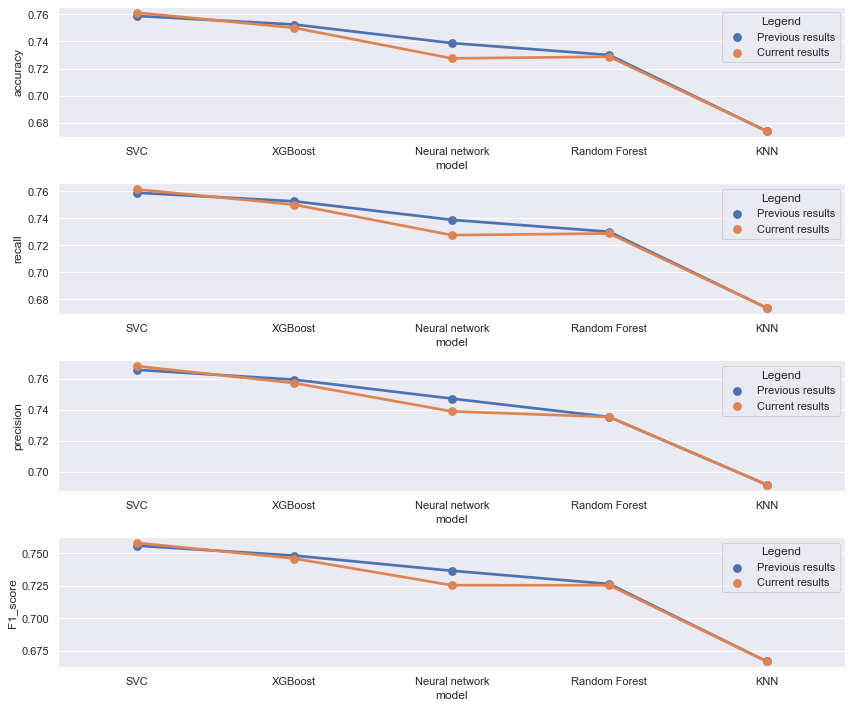

In [76]:
vis.plot_result_point(result_after_engineering, w_time=False, result_best=result_after_engineering_targ_hyp)

So below we can see tuned instances of best algorithms.

In [85]:
# Support vector machines
svc = SVC(C=3.35)
svc_pipe = Pipeline([('scaler', StandardScaler()), ('svc', svc)])

# K nearest neighbors
knn = KNeighborsClassifier(n_neighbors=5, p=1, leaf_size=7, algorithm='ball_tree')
knn_pipe = Pipeline([('scaler', MinMaxScaler()), ( 'knn', knn)])

# Random Forest
rfc = RandomForestClassifier(n_estimators=366, max_depth = 22, min_samples_leaf=1, min_samples_split=3)
rfc_pipe = Pipeline([('scaler', MinMaxScaler()), ( 'rfc', rfc)])

# XGBoost 
xgb = XGBClassifier(objective='multi:softprob', max_depth=9, gamma=0.1, colsample_bytree=0.15,
                    learning_rate=0.15, min_child_weight=3)

# Neural network
mlp = MLPClassifier((200, 200, 150, 100), batch_size=16, alpha=0.03,
                    learning_rate='adaptive', early_stopping=True,
                    activation='tanh')
mlp_pipe = Pipeline([('scaler', StandardScaler()), ( 'mlp', mlp)])

# list of models
models = [('SVC', svc_pipe),
          ('KNN', knn_pipe),
          ('Random Forest', rfc),
          ('XGBoost', xgb),
          ('Neural network', mlp_pipe)]

#### Ensemble methods

Again, we can use ensemble methods and try to extract some more percents for our accuracy. Below we train voting classifier and it improves the best solution by some value. For now the best result was SVC with 76.12% accuracy but voting classifier goes slightly better with 76.37%.

In [86]:
# Voting classifier
voting_classifier = VotingClassifier(models)
voting_classifier.fit(X, y)

# 10 fold cross-validation
ensemble_result = cross_validate(voting_classifier, X, y, cv=10, scoring=scoring)

# print the result
unpacking_measures_dict('Voting Classifier', ensemble_result)

,model,accuracy,recall,precision,F1_score,time
0,Voting Classifier,0.76375,0.76375,0.77955,0.758475,7.097514


We should try also with stacked classifier. It obtains 77.37% which is the best solution for now, and it will be use as final model to predict genres from test set.

In [87]:
# Stacked classifier
stacked_classifier = StackingClassifier(models, final_estimator=LogisticRegression(max_iter=5000), cv=10)
stacked_classifier.fit(X, y)

# 10 fold cross-validation
stacked_result = cross_validate(voting_classifier, X, y, cv=10, scoring=scoring)

# print the result
unpacking_measures_dict('Stacking Classifier', stacked_result)

,model,accuracy,recall,precision,F1_score,time
0,Stacking Classifier,0.77375,0.77375,0.788704,0.767995,6.804798


# Present result

We have done with modelling, so the last part is to check how it performs on unseen data. We could estimate this result a bit by performing 10 fold cross-validation, but to get reliable points of view we will use sampled test set.<br>
To this moment we didn't touch it to prevent from data leakage, but it is the moment when we have to process it to the final form. So we define feature extractor for it with appropriate columns to extract.

In [89]:
def test_feature_extract(df):
    '''This function is the best set feature extraction. It should return dataframe with 79 columns, so
    high correlated columns are not included. 
       
       Parameters
       -------------------
       df: pandas dataframe
           dataframe which contain path to audio file
      
       Returns
       ------------------
       pandas dataframe with calculated features'''
    
    # iterating over index and path to file
    for i, file in zip(df.index, df.file):
        # creating wave
        x, sr = librosa.load(file)
        
        # basic statistics of wave
        df.loc[i, 'wave_mean'] = np.mean(x)
        df.loc[i, 'wave_max'] = np.max(x)
        
        # Preparing the frequency in decibel
        X = librosa.stft(x)
        Xdb = librosa.amplitude_to_db(np.abs(X))
        df.loc[i, 'db_mean'] = np.mean(Xdb)
        df.loc[i, 'db_std'] = np.std(Xdb)

        # zero crossings
        cross_rate = librosa.feature.zero_crossing_rate(x)
        df.loc[i, 'zero_crossing'] = np.sum(librosa.zero_crossings(x))
        df.loc[i, 'zero_crossing_rate_min'] = np.min(cross_rate)
        df.loc[i, 'zero_crossing_rate_std'] = np.std(cross_rate)


        # spectral rolloff
        spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=sr)
        df.loc[i, 'spectral_rolloff_min'] = np.min(spectral_rolloff)
        
        # rms
        rms = librosa.feature.rms(x)
        df.loc[i, 'rms_mean'] = np.mean(rms)
        df.loc[i, 'rms_std'] = np.std(rms)    
        df.loc[i, 'rms_min'] = np.min(rms)
        df.loc[i, 'rms_max'] = np.max(rms)
        
        # spectral_centroid
        spectral_centroid = librosa.feature.spectral_centroid(x)
        df.loc[i, 'spectral_centroid_std'] = np.std(spectral_centroid)    
        df.loc[i, 'spectral_centroid_max'] = np.max(spectral_centroid) 
        
        # spectral bandwitdh
        spectral_bandwidth = librosa.feature.spectral_bandwidth(x)
        df.loc[i, 'spectral_bandwidth_min'] = np.min(spectral_bandwidth)
        df.loc[i, 'spectral_bandwidth_max'] = np.max(spectral_bandwidth)
        df.loc[i, 'spectral_bandwidth_std'] = np.std(spectral_bandwidth)

        
        # spectral contrast
        spectral_contrast = librosa.feature.spectral_contrast(x)
        df.loc[i, 'spectral_contrast_mean'] = np.mean(spectral_contrast)
        df.loc[i, 'spectral_contrast_std'] = np.std(spectral_contrast)    
        df.loc[i, 'spectral_contrast_min'] = np.min(spectral_contrast)
        df.loc[i, 'spectral_contrast_max'] = np.max(spectral_contrast)
        
        # spectral flatness
        spectral_flatness = librosa.feature.spectral_flatness(x)
        df.loc[i, 'spectral_flatness_std'] = np.std(spectral_flatness)    
        df.loc[i, 'spectral_flatness_min'] = np.min(spectral_flatness)
        
        # poly features
        poly_features = librosa.feature.poly_features(x)
        for feat in range(len(poly_features)):
            df.loc[i, 'poly_features_min'+str(feat)] = np.min(poly_features[feat])
            if feat != 1:
                df.loc[i, 'poly_features_max'+str(feat)] = np.max(poly_features[feat])
       
        tonnetz = librosa.feature.tonnetz(x)
        for feat in range(len(tonnetz)):
            df.loc[i, 'tonnetz_mean'+str(feat)] = np.mean(tonnetz[feat])
            if feat not in [2, 4]:
                df.loc[i, 'tonnetz_std'+str(feat)] = np.std(tonnetz[feat])    
            df.loc[i, 'tonnetz_min'+str(feat)] = np.min(tonnetz[feat])
            df.loc[i, 'tonnetz_max'+str(feat)] = np.max(tonnetz[feat])
            
        # mfcc features
        mfccs = librosa.feature.mfcc(x, sr=sr, n_mfcc=30)
        # iterating over 30 mfcc features
        for feat, mfcc in enumerate(mfccs):
            if feat != 0:
                df.loc[i, 'mfcc_'+str(feat+1)] = np.mean(mfcc)
                
    return df

It looks that everything is fine. We only need to add labels from kmeans algorithm.

In [90]:
test = test_feature_extract(test)
test

,file,label,wave_mean,wave_max,db_mean,db_std,zero_crossing,zero_crossing_rate_min,zero_crossing_rate_std,spectral_rolloff_min,...,mfcc_21,mfcc_22,mfcc_23,mfcc_24,mfcc_25,mfcc_26,mfcc_27,mfcc_28,mfcc_29,mfcc_30
57,data\genres\classical\classical.00093.wav,classical,-0.001147,0.727600,-21.046556,13.675632,71753.0,0.021484,0.029371,1550.390625,...,3.569499,-6.566840,-2.094077,-7.228578,1.156335,-1.126699,-0.535059,-0.522211,-1.918716,-8.850042
368,data\genres\metal\metal.00092.wav,metal,-0.000021,0.986603,-7.746313,16.222530,61806.0,0.037109,0.033071,2853.149414,...,-5.513703,-2.284488,-2.005758,-0.811633,-4.527788,-4.461908,-2.830909,-6.958305,-3.015862,-4.424421
706,data\genres\blues\blues.00094.wav,blues,-0.000104,0.987579,-18.822342,13.413120,33708.0,0.005859,0.050054,312.231445,...,-0.870614,-6.533965,-11.078423,-7.635077,3.129655,-2.027440,-2.863658,-2.880874,-2.535628,-4.112926
676,data\genres\jazz\jazz.00094.wav,jazz,-0.000028,0.271057,-32.270058,11.858809,27503.0,0.008301,0.019602,204.565430,...,7.303191,6.532443,1.564564,-1.031004,0.060450,-4.308903,-2.974179,-0.345201,-0.862798,-7.059286
231,data\genres\jazz\jazz.00001.wav,jazz,0.000288,0.255035,-32.875763,15.516398,39309.0,0.011230,0.032775,559.863281,...,1.900917,0.660646,-2.048242,-2.337252,-1.373868,-0.995203,0.538788,-0.421904,-2.275236,-4.208530
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
568,data\genres\pop\pop.00010.wav,pop,0.000002,0.981689,-9.863032,13.665635,43831.0,0.007812,0.047261,355.297852,...,-1.573002,0.513123,-0.498550,-2.803835,-1.659332,0.139487,-0.179599,-5.206236,-7.780830,-2.891968
807,data\genres\country\country.00014.wav,country,-0.000008,0.618896,-8.248831,10.882477,82710.0,0.014160,0.081636,2874.682617,...,-3.636799,-3.197098,1.207237,-1.198664,-1.816898,-1.510351,-1.251105,-3.448342,-7.063308,-4.815404
280,data\genres\jazz\jazz.00005.wav,jazz,-0.000012,0.767700,-22.259039,14.177602,38372.0,0.006836,0.030112,129.199219,...,-4.628977,-3.811160,-2.019923,-2.858787,-1.686325,-4.204429,0.680023,-1.642156,-3.233958,-8.980921
224,data\genres\country\country.00007.wav,country,-0.001376,0.761688,0.031531,10.534401,74790.0,0.016602,0.042239,2767.016602,...,-2.216698,0.597534,-1.292326,-0.087290,-0.485658,-0.182956,-1.423479,-0.131059,-6.834740,-4.374464


In [91]:
# Defining Kmeans with k=10
km = KMeans(n_clusters=10)
km.fit(X_mm_scaled)

# Extracting numeric features
test_num = test.drop(['file', 'label'], axis=1)

# Preparing test arrays
X_test, y_test = test_num, test['label']

# scaling arrays
X_test_mm_scaled = minmax_scaler.fit_transform(X_test)

# Adding feature with KMeans prediction
X_test['kmeans'] = km.fit_predict(X_test_mm_scaled)  
X_test = X_test.loc[:, X.columns]

Everything is ready so let's check the results.

In [92]:
preds = stacked_classifier.predict(X_test)

In [93]:
print(classification_report(preds, y_test))

              precision    recall  f1-score   support

       blues       1.00      0.80      0.89        25
   classical       0.85      0.94      0.89        18
     country       0.60      0.75      0.67        16
       disco       0.80      0.73      0.76        22
      hiphop       0.80      0.73      0.76        22
        jazz       0.90      0.90      0.90        20
       metal       0.90      0.90      0.90        20
         pop       0.90      0.86      0.88        21
      reggae       0.70      0.67      0.68        21
        rock       0.45      0.60      0.51        15

    accuracy                           0.79       200
   macro avg       0.79      0.79      0.78       200
weighted avg       0.81      0.79      0.80       200



We get 79% accuracy overall which is not bad. Our model works on pretty well on unseen data. From the classification report we conclude that our model has greatest problems with rock genre. If we could remove it from prediction classes our accuracy would jump up above 80%. It is tempting, but that wasn't our task. We wanted to get more expirience with processing audio data and we made it. <br>
As the icing on the cake, we will train our model on the whole dataset. We checked what we wanted, it means how it performs on unseen data. If we want to deploy it then every observation may be needed to improve performance.

In [94]:
# Joining training and test set
X = X.append(X_test, ignore_index=True)
y = y.append(y_test, ignore_index=True)

In [95]:
# Learning model on whole dataset
stacked_classifier = StackingClassifier(models, final_estimator=LogisticRegression(max_iter=5000), cv=10)
stacked_classifier.fit(X, y);

We are exporting our final model to pickle format. We can use it for the future when it will be needed.

In [124]:
joblib.dump(stacked_classifier, 'stacked_model.pkl') 

['stacked_model.pkl']

# Conclusion

So our problem was to classify an audio file by its genre. Solution for that could be used in recommendation algorithm. We can identify which music is the best option for someone and find matching type of other pieces which algorithm could show him/her. As we can imagine this project has quite a good application in the market. For me it was of course a challenge to test my current knowledge and extend it in audio data analysis. It will definitely help me in writing my thesis. <br>
So how does it look like. Firstly, we needed to store somehow our data and get access to music files in our cache. We quickly checked that observations weren't nulls, so we could use them in further analysis. We performed feature extraction with librossa library which state of calculating statistics from for example spectrogram. Then we would inspect if our features were reasonable and after checking correlation and its feature importance we had to select and remove unnecessary columns.
The next step was to use spot-check algorithms to determine which type of model is suitable to this problem. We prepared a bunch of models, checked out their results and choose 5 best performing algorithm regarding which type of scaling was best suited for their learning. Further, we improve our results by hyperparameter tuning, ensemble methods and repeating feature engineering step. To the moment when we decided to keep our model, which satisfied our needs, we had to evaluate it. WE had to prepare test set which wasn't used during learning and process it appropriately. <br>
We get 79% accuracy in general which I find is not bad result by using standard machine learning methods. I read about using convolution neural networks to analysing spectrograms. They could obtain above 90% accuracy, but I wanted to focus on more classic approach. We only allow yourself using scickit learn implementation of multi layer perceptron, which oddly enough wasn't the best among classic ML algorithms. Most of the models performing on GTZAN dataset which I saw reached about 60, maybe 70 percent, so I'm happy from my nearly greater result by about 10%. <br>
If we want to deploy it model we should thought about slicing provided sample to some pieces of 30 second long. With this method we will get more than one observation and something impretable to our model. After predicting genre of every piece we can choose the genre which occurred most frequently. It could boost our accuracy by some points.
In summary, we decided to analyze audio data and classify music by its genre, we go from each step which should occur in real data science project and we prepare the model with accuracy of 79%, ready to send on production.